In [2]:
import yfinance as yf
import pandas as pd
import numpy as np
import os
import json
import pandas_datareader.data as web   # my local kernel Python 3.10.7 
import matplotlib.pyplot as plt  # unavailable?  do: 1. pip uninstall matplotlib # 2. python3 -m pip install matplotlib
%matplotlib inline
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
import datetime
import io

In [3]:
if os.path.exists("C:\August2022\ES 12-22 Globex_2022_09_21amended21.csv"):  #  "C:\August2022\ES 12-22 Globex_2022_09_21amended21.csv"
    es = pd.read_csv("C:\August2022\ES 12-22 Globex_2022_09_21amended21.csv", index_col= 0, parse_dates=True)
else:
    es = yf.Ticker("C:\August2022\ES 12-22 Globex_2022_09_21amended21.csv")
    es.to_csv("ES_Aug_21_2022_Amended.csv")

### Derive basic time metrics columns and convert categorical to numerical

In [4]:
mapping = {'AtBid': -1, 'AtAsk': 1, 'BelowBid': -2, 'AboveAsk': 2, 'BetweenBidAsk':0 }   # remap categorical ---->  ints 
es = es.replace({'BidAsk': mapping})

In [5]:
es.loc['2022-09-21 09:20:00.900' : '2022-09-21 09:50:00.900'].head(5)


,Vol,BidAsk,Bid,Ask,Price
DateTime,,,,,
2022-09-21 09:20:01.392,1,1,3893.75,3894.0,3894.0
2022-09-21 09:20:01.392,1,1,3893.75,3894.0,3894.0
2022-09-21 09:20:01.392,1,1,3893.75,3894.0,3894.0
2022-09-21 09:20:01.392,1,1,3893.75,3894.0,3894.0
2022-09-21 09:20:01.392,1,1,3893.75,3894.0,3894.0


In [6]:
es.dtypes  # 
# type(es.index)   # pandas.core.indexes.datetimes.DatetimeIndex

Vol         int64
BidAsk      int64
Bid       float64
Ask       float64
Price     float64
dtype: object

In [7]:
del es["Bid"]
del es['Ask']

In [8]:
es.head()

,Vol,BidAsk,Price
DateTime,,,
2022-09-21 00:00:00.720,1,-1,3879.50
2022-09-21 00:00:00.720,1,-1,3879.50
2022-09-21 00:00:00.900,1,1,3879.75
2022-09-21 00:00:00.900,1,1,3879.75
2022-09-21 00:00:00.900,1,1,3879.75


### Features: BidAsk in last 2000, 1000, 500 transactions

In [9]:
es['BA_5h'] = es['BidAsk'].rolling(500).sum() # GOOD ONE
es['BA_1K'] = es['BidAsk'].rolling(1000).sum() # GOOD ONE
es['BA_2K'] = es['BidAsk'].rolling(2000).sum() # GOOD ONE
es['BA_5K'] = es['BidAsk'].rolling(5000).sum() # GOOD ONE

In [10]:
es['BA_St_1h'] = (es['BidAsk'].rolling(100).mean()  - es['BidAsk'].rolling(100).var())  / (es['Price'].rolling(100).max() - es['Price'].rolling(100).min()) * 100 # Stochastic BidAsk 
es['BA_St_1K'] = (es['BidAsk'].rolling(1000).mean() - es['BidAsk'].rolling(1000).var()) / (es['Price'].rolling(1000).max()- es['Price'].rolling(1000).min()) * 100 # Stochastic BidAsk
es['BA_St_5k'] = (es['BidAsk'].rolling(5000).mean() - es['BidAsk'].rolling(5000).var()) / (es['Price'].rolling(5000).max()- es['Price'].rolling(5000).min()) * 100 # Stochastic BidAsk

#### Stochastic:   %K = ( C − L14  / H14 − L14  ) × 100
- C: latest Price
- L14: Lowest within 14 period
- H14: Higest within 14 period
- %K: Current Stochastik Value
- esT3['Stoch20'] = es['Price'].rolling(20).mean()

In [14]:
es['Prc_St_10'] = (es['Price'].rolling(10).mean()  - es['Price'].rolling(10).min())  / (es['Price'].rolling(10).max() - es['Price'].rolling(10).min()) * 100 # Stochastic
es['Prc_St_1h'] = (es['Price'].rolling(100).mean() - es['Price'].rolling(100).min()) / (es['Price'].rolling(100).max()- es['Price'].rolling(100).min()) * 100 # Stochastic
es['Prc_St_1k'] = (es['Price'].rolling(1000).mean() - es['Price'].rolling(1000).min()) / (es['Price'].rolling(1000).max()- es['Price'].rolling(1000).min()) * 100 # Stochastic

### MACD MACD = 12Periods EMA − 26Periods EMA

In [20]:
es['MACD_3_9']  = (es['Price'].rolling(300).mean() - es['Price'].rolling(900).mean() ) * 100  #  MACD 300- 900 
es['MACD_7_2K'] = (es['Price'].rolling(700).mean() - es['Price'].rolling(2000).mean()) * 100  #  MACD 700 - 2000

In [22]:
es.Prc_St_1k.min() # 21.9800000000032  Min and Max of Stochastic vals
es.Prc_St_1k.max() # 80.06666666666811

21.9800000000032

In [23]:
es.sample(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1h,BA_St_1K,BA_St_5k,Prc_St_10,Prc_St_1h,Prc_St_1k,MACD_3_6,MACD_7_12K,MACD_3_9,MACD_7_2K
DateTime,,,,,,,,,,,,,,,,,
2022-09-21 14:18:32.844,1,-1,3837.50,-46.0,-74.0,-57.0,-27.0,-251.515152,-66.949807,-39.260177,45.0,40.500000,37.300000,-30.583333,3.494048,-38.583333,-5.789286
2022-09-21 09:31:32.448,1,-1,3897.25,0.0,-47.0,-106.0,319.0,-197.939394,-84.864384,-25.679073,10.0,47.500000,36.440000,-11.875000,-23.821429,-23.083333,-52.833929
2022-09-21 14:23:16.680,1,1,3846.50,21.0,22.0,-117.0,-544.0,-150.707071,-33.065003,-24.670473,70.0,49.000000,56.838462,8.833333,54.791667,36.944444,54.912500
2022-09-21 09:33:13.896,2,1,3888.75,-52.0,-172.0,-179.0,-358.0,-272.727273,-58.370571,-27.506979,NaN,79.000000,46.387500,-10.833333,-48.845238,-37.472222,-119.203571
2022-09-21 16:00:21.996,1,-1,3800.00,-153.0,-249.0,-369.0,-842.0,-478.787879,-118.338338,-24.989153,NaN,13.000000,60.660000,-25.916667,-19.830357,-37.277778,-41.180357
2022-09-21 14:55:53.140,1,-1,3909.50,21.0,157.0,309.0,-16.0,-89.858586,-40.456087,-15.673595,80.0,71.833333,57.600000,37.583333,-42.491071,11.916667,11.733929
2022-09-21 09:50:28.852,1,1,3900.00,92.0,60.0,-69.0,-169.0,-205.939394,-35.397579,-33.460563,60.0,43.500000,45.363636,39.416667,40.943452,72.666667,50.276786
2022-09-21 15:09:20.336,1,1,3891.75,-25.0,39.0,-334.0,-411.0,-141.478788,-31.989647,-16.364908,90.0,66.800000,55.942857,35.583333,54.610119,59.888889,71.014286
2022-09-21 15:13:14.468,1,2,3870.50,21.0,106.0,-50.0,546.0,-46.848485,-26.870871,-18.872061,10.0,37.500000,45.152941,60.500000,57.062500,103.555556,80.037500


In [25]:
es['Shifted2K'] = es['Price'].shift(2000)   #    Price shifted 30K in future
es['Shifted30K'] = es['Price'].shift(30000) 

In [26]:
es.sample(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1h,BA_St_1K,BA_St_5k,Prc_St_10,Prc_St_1h,Prc_St_1k,MACD_3_6,MACD_7_12K,MACD_3_9,MACD_7_2K,Shifted2K,Shifted30K
DateTime,,,,,,,,,,,,,,,,,,,
2022-09-21 15:01:12.124,1,1,3899.50,-42.0,16.0,-51.0,-711.0,-197.939394,-39.231231,-14.282338,50.0,45.500000,42.650000,-75.875000,-7.413690,-70.555556,-5.892857,3901.00,3896.50
2022-09-21 15:19:20.068,1,-1,3880.75,146.0,191.0,116.0,-816.0,-154.424242,-31.108537,-22.954331,50.0,41.000000,57.442857,38.333333,44.235119,52.750000,85.076786,3878.75,3885.50
2022-09-21 15:12:23.520,1,1,3859.75,116.0,349.0,442.0,82.0,-90.154882,-34.185786,-14.835571,50.0,68.666667,44.308333,2.250000,-25.357143,-39.611111,30.755357,3856.25,3892.25
2022-09-21 14:33:49.348,1,-1,3868.00,-11.0,4.0,-221.0,145.0,-134.949495,-49.358013,-22.775192,40.0,43.000000,44.854545,45.708333,35.583333,72.722222,-0.550000,3868.75,3839.50
2022-09-21 15:04:43.644,1,-1,3899.00,-10.0,134.0,188.0,-193.0,-115.737374,-40.483320,-15.524384,60.0,58.500000,60.463636,-43.666667,2.089286,-49.888889,62.976786,3898.00,3911.50
2022-09-21 15:14:11.920,1,1,3880.50,143.0,173.0,90.0,133.0,-28.929293,-18.634297,-20.580439,NaN,56.000000,49.400000,45.791667,98.089286,143.833333,162.039286,3876.00,3866.75
2022-09-21 01:02:20.284,1,-1,3878.00,46.0,-6.0,2.0,NaN,-161.454545,-36.368302,NaN,NaN,44.000000,49.333333,46.958333,-3.366071,79.138889,48.146429,3876.25,NaN
2022-09-21 14:16:47.724,1,1,3842.00,169.0,134.0,-28.0,188.0,-226.262626,-78.031060,-19.754624,NaN,47.500000,42.371429,-0.916667,-1.205357,-4.305556,-35.430357,3844.00,3848.00
2022-09-21 15:14:09.736,1,1,3878.50,-3.0,0.0,-212.0,312.0,-234.303030,-46.009646,-16.209017,60.0,63.500000,36.527273,14.291667,23.372024,35.500000,6.730357,3878.25,3867.00


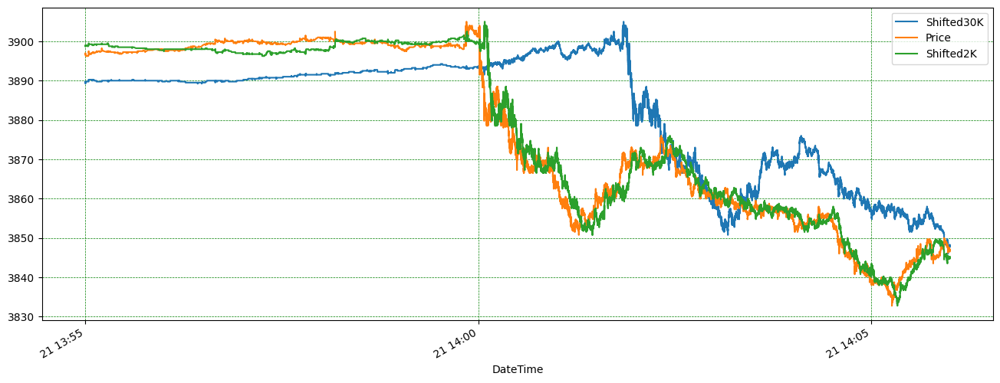

In [27]:
es["2022-09-21 13:55":"2022-09-21 14:05"].plot( y=['Shifted30K','Price', 'Shifted2K' ], figsize=(16,6))    # Price and PriceShifted by 2K and 20K approx 30 secs and 160 secs shifted in future
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

###  BidAsk, Vol, Price derived features

In [28]:
es['Vol_avg2h_PT'] = es['Vol'].rolling(200).mean()  *  ( es['Price'].rolling(200).min() - es['Price'].rolling(200).max()   ) * 100
es['Vol_CumS_PT'] = es['Vol'].rolling(200).sum() *  ( es['Price'].rolling(200).min() - es['Price'].rolling(200).max()   )

es['BA_CumSumPT4h'] = es['BidAsk'].cumsum() *  ( es['Price'].rolling(400).min() - es['Price'].rolling(400).max()   ) / 1000  #   cumulative sum delta of Bid/Ask * Price delta
es['BA_CumSumPT1_3K'] = es['BidAsk'].cumsum() *  ( es['Price'].rolling(1000).var() - es['Price'].rolling(3000).std()   ) / 1000  # cumulative sum delta of Bid/Ask * Price spread - std


In [29]:
es.shape  # (1814632, 23)
# es['BA_CumSumPT4h'].max()

(1814632, 23)

In [30]:
es.sample(2)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1h,BA_St_1K,BA_St_5k,...,MACD_3_6,MACD_7_12K,MACD_3_9,MACD_7_2K,Shifted2K,Shifted30K,Vol_avg2h_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT1_3K
DateTime,,,,,,,,,,,,,,,,,,,,,
2022-09-21 15:56:28.500,1,-1,3812.50,-116.0,-232.0,-247.0,-708.0,-250.383838,-47.164925,-38.771215,...,-21.291667,-57.824405,-56.472222,-63.441071,3815.0,3823.75,-89.625,-179.25,53.6810,23.563593
2022-09-21 15:12:35.244,1,-1,3860.75,274.0,381.0,355.0,417.0,-48.767677,-31.338672,-23.624018,...,41.083333,41.648810,91.805556,50.994643,3859.0,3891.00,-136.875,-273.75,74.9385,0.329083


In [31]:
es1 = es.copy()  # copy to new df before adding additional features

Derivatives of Price

In [32]:
es1['STD_200'] = es1['Price'].rolling(200).std()  # std every 200 rows
es1['AVG_200'] = es1['Price'].rolling(200).mean() # mean every 200 rows
es1['AVG_200_Vol'] = es1['Vol'].rolling(200).mean() #  Vol mean every 200 rows
es1['Price_R_BA_V'] = es1['Price'] * es1['STD_200'] / (es1['AVG_200']) #  200 rows calc of Price * STD / mean ratio
es1['BA_Price_V'] = es1['BidAsk'] * es1['Price'] / es1['Vol'] 
#-------------------------- Moving Averages
es1['STD20K'] = es1['Price'].rolling(20000).std()
es1['MA30K'] = es1['Price'].rolling(30000).mean() 
es1['MA50K'] = es1['Price'].rolling(50000).mean() 
es1['MA70K'] = es1['Price'].rolling(70000).mean() 
es1['MA100K'] = es1['Price'].rolling(100000).mean() 
es1['MA200K'] = es1['Price'].rolling(200000).mean() 
es1['MA300K'] = es1['Price'].rolling(300000).mean() 
#----------------------------------- Derivatives from MA, Vol, variation, mean, Vol
es1['Var_Vol_100K'] = es1['Price'].rolling(100000).var() / es1['Price'].rolling(100000).mean()
es1['Var_MinMax_MA20K'] = es1['Price'].rolling(20000).var()   *  es1['Price'].rolling(20000).min()  / es1['Price'].rolling(20000).max() 
es1['Var_ver'] = es1['Price'].rolling(20000).var() / es1['Price'].rolling(10000).var() * 100 # Price variance difference over 20K / 10K 
# -------------------------- BidAsk * Volume / mean of interval
es1['BA_Vol_Avg40K'] = es1['BidAsk'].rolling(40000).var() *  es1['BidAsk'].rolling(40000).sum()  * es1['Vol'].rolling(40000).mean() 
es1['BA_BA_Avg40K'] = es1['BidAsk'].rolling(40000).var() *  es1['BidAsk'].rolling(40000).sum()  * es1['BidAsk'].rolling(40000).mean() 
#-------------------------- adding rolld 5T Volume summed
es1['5_val'] = es1.rolling('5T').Vol.sum() # (1814632,) 
#-------------- shifted Price_Target  and Price_Target5 columns 
es1['Price_Target'] = es1['Price'].shift(8000)  #  amounts to some 30 seconds of avr ticks (transactions) for 5 min we need greater amount of avg ticks, like 80,000
es1['Price_Target5'] = es1['Price'].shift(80000) # about 5 min shift
es1['B_A_CumSum'] = es1['BidAsk'].cumsum()  # cumulative sum delta of Bid/Ask

'B_A_CumSumAvr2K','B_A_CumSumAvr5K','B_A_CumSumAvr10K'

In [33]:
es1['B_A_CumSumAvr2K'] = es1['BidAsk'].rolling(2000).mean()  #  sum delta of Bid/Ask over 2K
es1['B_A_CumSumAvr4K'] = es1['BidAsk'].rolling(4000).mean() #  sum delta of Bid/Ask over 10K
es1['B_A_CumSumAvr10K'] = es1['BidAsk'].rolling(10000).mean() #  sum delta of Bid/Ask over 5K

In [34]:
es1.shape  # (1814632, 47)

(1814632, 47)

In [35]:
pd.set_option('display.max_columns', None) # display all columns
es1.sample(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1h,BA_St_1K,BA_St_5k,Prc_St_10,Prc_St_1h,Prc_St_1k,MACD_3_6,MACD_7_12K,MACD_3_9,MACD_7_2K,Shifted2K,Shifted30K,Vol_avg2h_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT1_3K,STD_200,AVG_200,AVG_200_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,B_A_CumSumAvr2K,B_A_CumSumAvr4K,B_A_CumSumAvr10K
DateTime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-09-21 12:26:34.492,1,1,3894.75,34.0,-6.0,-52.0,-175.0,-216.727273,-81.518158,-35.085951,80.0,41.000000,49.080000,24.791667,7.383929,41.500000,-5.903571,3895.00,3891.50,-65.750,-131.50,7.27800,4.918020,0.122372,3894.49000,1.315,0.122380,3894.75,0.863651,3893.866825,3893.470660,3892.914986,3891.906985,3893.136836,3894.265404,0.001404,0.745080,105.049261,473.844231,2.355230,5875.0,3895.25,3889.25,-14556,-0.0260,-0.01175,-0.0260
2022-09-21 14:29:25.840,1,1,3851.00,65.0,84.0,64.0,-204.0,-7.626263,-40.962082,-41.629103,40.0,47.875000,30.150000,-7.041667,22.678571,2.166667,30.828571,3848.50,3845.00,-320.625,-641.25,63.44100,11.548623,0.662169,3849.46500,1.425,0.662433,3851.00,3.880332,3852.891325,3850.256330,3847.419864,3846.289555,3848.421994,3856.413127,0.008429,15.004331,185.636759,1404.907806,26.827385,30748.0,3854.25,3842.00,-28196,0.0320,0.02175,-0.1663
2022-09-21 13:08:06.944,1,-1,3891.25,-139.0,-273.0,-340.0,-508.0,-167.676768,-61.621522,-40.606562,NaN,34.000000,50.887500,-23.083333,-29.205357,-51.583333,-45.755357,3893.25,3899.50,-111.750,-223.50,16.04700,3.386497,0.268054,3891.67250,1.490,0.268025,-3891.25,1.765602,3894.187592,3895.121990,3894.728525,3894.093695,3892.418778,3894.115574,0.001434,3.111750,798.690177,-2906.061397,92.082190,7445.0,3890.50,3891.50,-16047,-0.1700,-0.09300,-0.0607
2022-09-21 14:55:48.208,1,1,3910.50,203.0,341.0,341.0,-133.0,-120.303030,-29.860146,-16.357238,NaN,44.250000,51.821429,-76.958333,37.711310,-93.472222,98.494643,3907.50,3890.75,-114.500,-229.00,84.38925,32.993188,0.336803,3910.19750,1.145,0.336829,3910.50,3.819082,3901.536417,3897.479075,3897.439443,3903.450080,3894.687209,3883.695360,0.031566,14.524810,351.446338,4187.814006,218.647710,39968.0,3910.00,3916.00,-30687,0.1705,0.04950,0.0514
2022-09-21 14:37:58.236,1,1,3880.25,-48.0,-97.0,51.0,529.0,-160.282828,-46.246086,-19.878655,35.0,58.000000,63.126667,12.791667,45.845238,42.055556,-20.021429,3883.25,3885.25,-157.500,-315.00,56.83300,19.187527,0.372719,3880.18000,1.050,0.372726,3880.25,2.113682,3879.140733,3878.766190,3875.176464,3867.583677,3856.942226,3854.814920,0.046225,4.453568,197.606122,-4640.541225,253.716175,82934.0,3880.50,3859.00,-32476,0.0255,0.12150,-0.0027
2022-09-21 13:27:19.248,1,-1,3889.75,8.0,56.0,-43.0,50.0,-247.838384,-54.507079,-49.445534,NaN,67.000000,59.114286,26.000000,37.717262,43.111111,70.108929,3888.50,3891.75,-76.750,-153.50,17.16700,6.645322,0.148268,3890.06375,1.535,0.148256,-3889.75,1.434233,3890.592383,3892.459850,3893.632993,3893.433252,3892.225894,3893.712330,0.002195,2.053986,821.334849,-4780.537079,209.022385,9103.0,3889.25,3894.50,-17167,-0.0215,-0.05975,0.0029
2022-09-21 14:24:53.268,1,2,3853.50,88.0,301.0,973.0,1617.0,-138.424242,-57.042042,-12.517047,30.0,41.666667,50.312500,-7.125000,34.264881,7.861111,110.235714,3850.00,3841.75,-143.750,-287.50,47.16075,40.991326,0.373081,3853.30250,1.150,0.373100,7707.00,2.067934,3846.621850,3844.196685,3843.555236,3846.313365,3848.598316,3859.212878,0.008662,4.264144,84.525964,5504.085904,449.371424,29531.0,3846.75,3848.25,-26949,0.4865,0.35300,0.1930
2022-09-21 06:43:42.832,1,-1,3879.00,-69.0,135.0,72.0,-607.0,-134.680135,-42.730367,-21.847649,NaN,55.333333,53.545455,-37.166667,17.044643,-57.055556,53.619643,3877.50,3878.75,-94.875,-189.75,10.26375,5.716408,0.182391,3879.13000,1.265,0.182384,-3879.00,3.093440,3878.611308,3876.527905,3872.649646,3871.854415,NaN,NaN,0.012056,9.536738,176.944789,-1870.829944,42.531503,1388.0,3879.50,3867.7

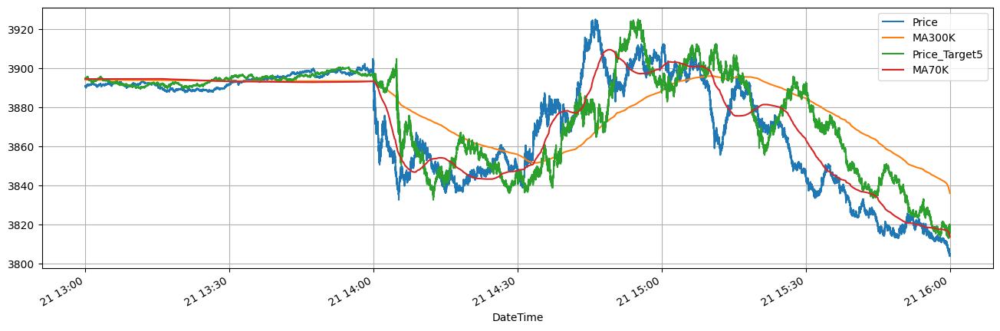

In [47]:

es1["2022-09-21 13:00:00":"2022-09-21 16:00:00"].plot( y=['Price', 'MA300K', 'Price_Target5', 'MA70K'],figsize=(16,5)) # normal Price plot 13 to 4 w 2 moving avrgs.
plt.grid()

In [48]:
es1.shape   # (1814632, 47)    1814632 ticks ; 144 5min intervals in 24 hrs; aprox 12,600 for each 5 min intervals; we will want calculations each 12,600 ticks to consider intervals of 5 min on avg. 
# es1.columns

(1814632, 47)

#### IDE

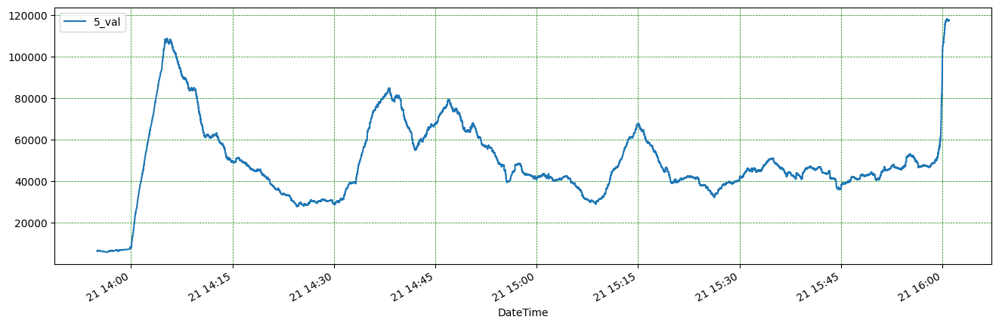

In [49]:
es1["2022-09-21 13:55":"2022-09-21 16:00"].plot( y='5_val' , figsize=(16,5))    # Interesting: Vol over 5T ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5) 

<AxesSubplot: xlabel='DateTime'>

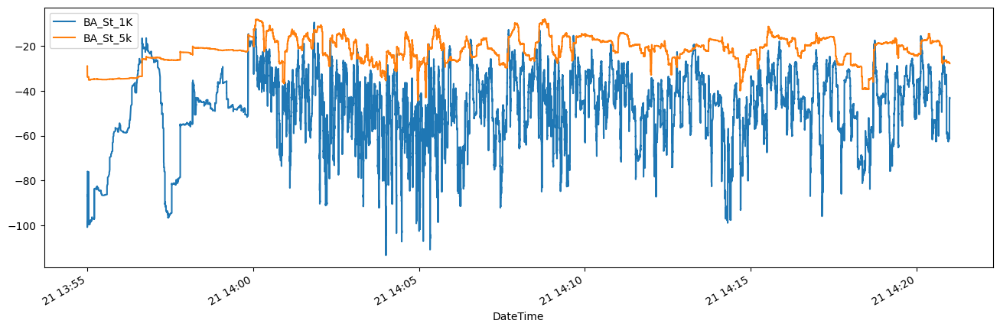

In [51]:
es1["2022-09-21 13:55":"2022-09-21 14:20"].plot( y=['BA_St_1K',	'BA_St_5k'], figsize=(16,5))    # Interesting BA 20 min 

<AxesSubplot: xlabel='DateTime'>

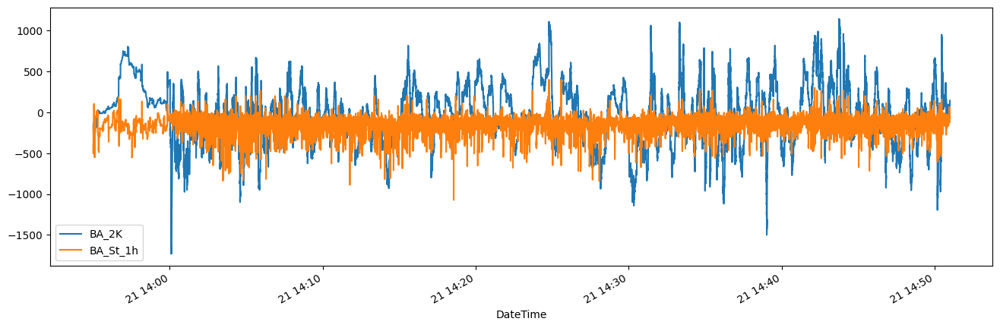

In [52]:
es1["2022-09-21 13:55":"2022-09-21 14:50"].plot( y=['BA_2K','BA_St_1h'], figsize=(16,5))    # Interesting BA

Very Interesting derivative 

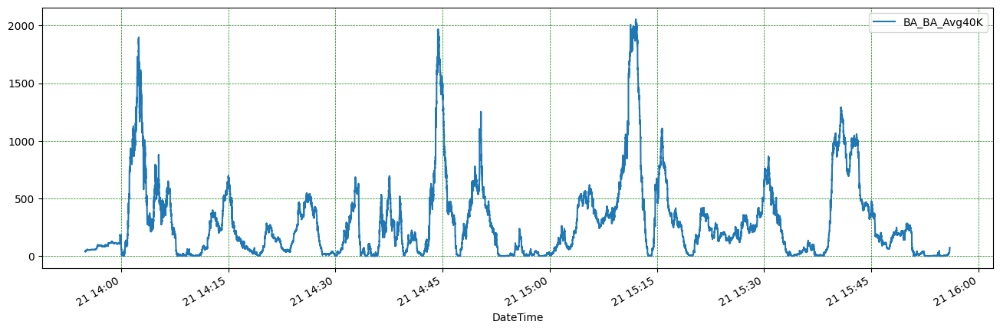

In [53]:
es1["2022-09-21 13:55":"2022-09-21 15:55"].plot( y='BA_BA_Avg40K' , figsize=(16,5))    # Very Interesting: BidAsk var * BA sum * BA mean ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5) 

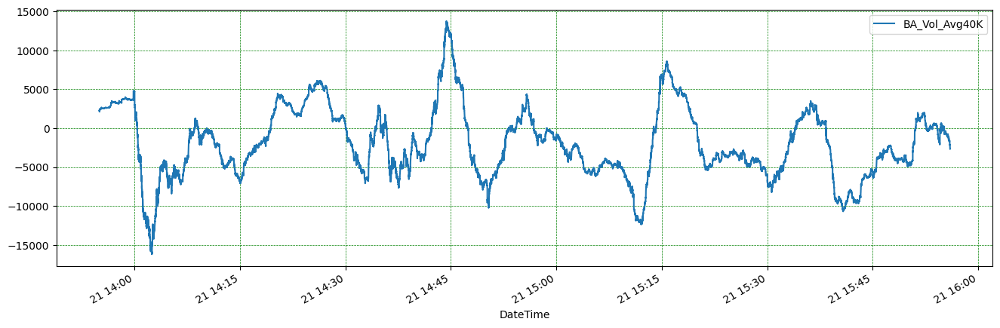

In [54]:

es1["2022-09-21 13:55":"2022-09-21 15:55"].plot( y='BA_Vol_Avg40K' , figsize=(16,5))    # Very Interesting: BidAsk var * BA sum * Vol mean ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)  

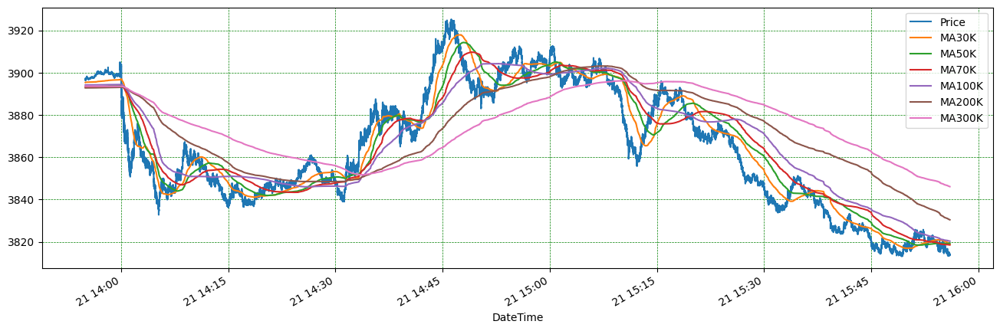

In [55]:
es1["2022-09-21 13:55":"2022-09-21 15:55"].plot( y=['Price', 'MA30K','MA50K','MA70K', 'MA100K','MA200K','MA300K' ], figsize=(16,5))    # 6 Ma ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

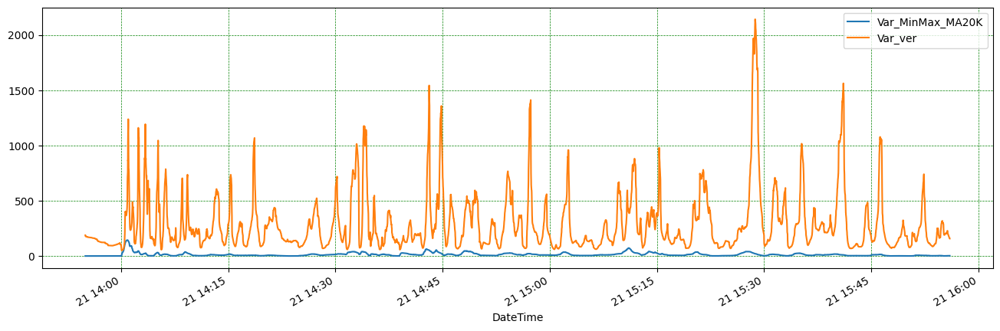

In [56]:
es1["2022-09-21 13:55":"2022-09-21 15:55"].plot( y=['Var_MinMax_MA20K', 'Var_ver' ], figsize=(16,5))    # Interesting: 2 derived features Ma ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

Var_MinMax_MA20K shows remarkable increases, but that is not odd considering the volatile moves. This feature is direct translation of the Variation, Min.Max over intervals. They do coincide w Price and Price is direct result of those inflections. With more modest magnitude Ver_Var also does the same. 
Try multiplying with Volume. TBD 

Since 10% of retail traders can not move the Market Index with great Volume force, Assumption is that large Spikes (Outliers) in many features are a footprint of 'BigMoney' transacting. 

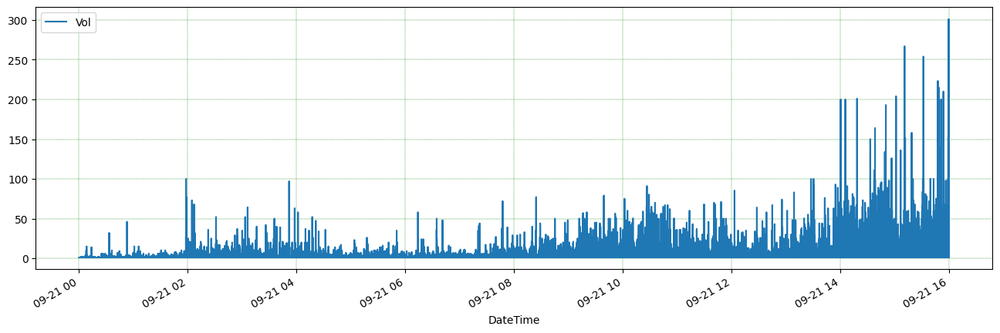

In [57]:
es1["2022-09-21 00:00:00":"2022-09-21 16:00:00"].plot( y='Vol', figsize=(16,5))  # volume througout the day
plt.grid(color = 'green', linestyle = '--', linewidth = 0.3)

Divide in 2 the most volatile rollercoaster moves during the last 2 hours: part I and II

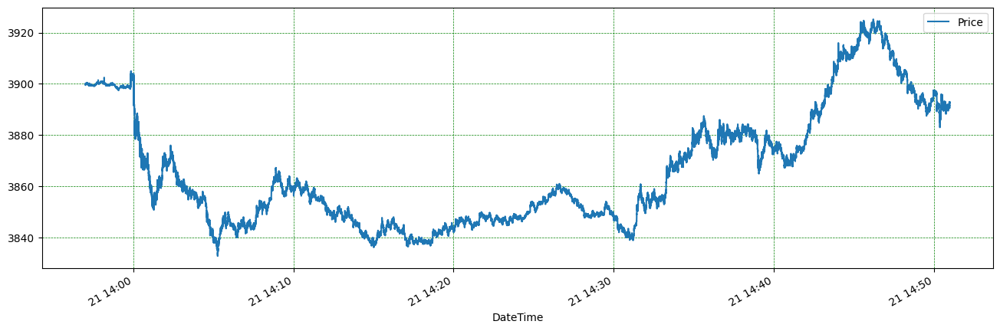

In [58]:
es1["2022-09-21 13:57":"2022-09-21 14:50"].plot( y='Price', figsize=(16,5))    #  part I of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

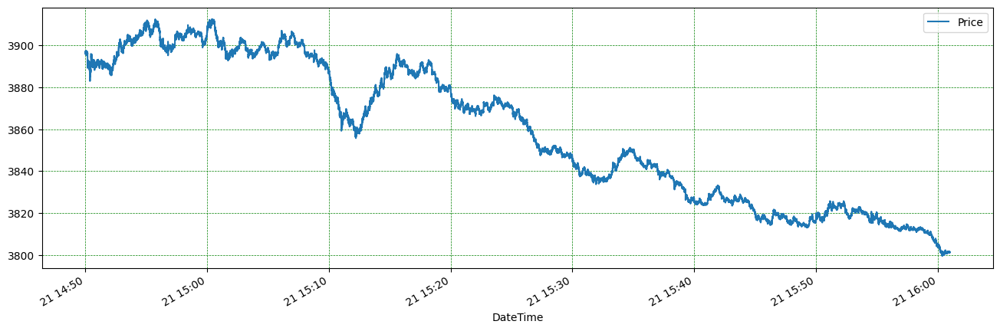

In [59]:
es1["2022-09-21 14:50":"2022-09-21 16:00"].plot( y='Price', figsize=(16,5))    #  part II of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

In [60]:
es1.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1h', 'BA_St_1K', 'BA_St_5k', 'Prc_St_10', 'Prc_St_1h',
       'Prc_St_1k', 'MACD_3_6', 'MACD_7_12K', 'MACD_3_9', 'MACD_7_2K',
       'Shifted2K', 'Shifted30K', 'Vol_avg2h_PT', 'Vol_CumS_PT',
       'BA_CumSumPT4h', 'BA_CumSumPT1_3K', 'STD_200', 'AVG_200', 'AVG_200_Vol',
       'Price_R_BA_V', 'BA_Price_V', 'STD20K', 'MA30K', 'MA50K', 'MA70K',
       'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K', 'Var_MinMax_MA20K',
       'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val', 'Price_Target',
       'Price_Target5', 'B_A_CumSum', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr4K',
       'B_A_CumSumAvr10K'],
      dtype='object')

TBD: Are inflection points in the Vol_avg100 indicative of future Price changes? 

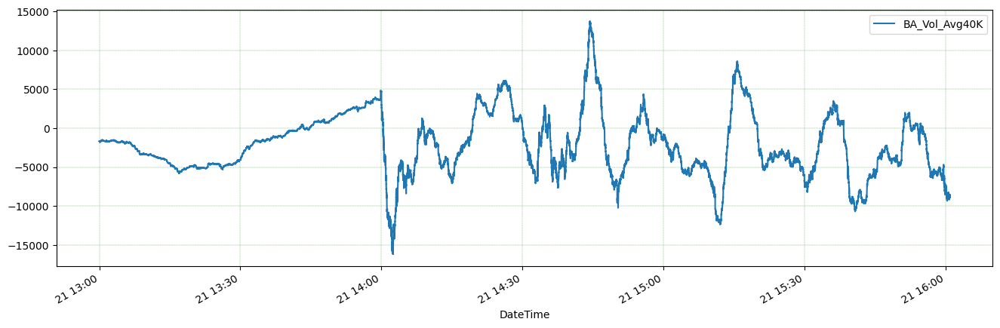

In [61]:
es1["2022-09-21 13:00":"2022-09-21 16:00"].plot( y='BA_Vol_Avg40K', figsize=(16,5)) # part I (and before) of the on BidAsk Volume mean of 40000 last ticks
plt.grid(color = 'green', linestyle = '--', linewidth = 0.2)

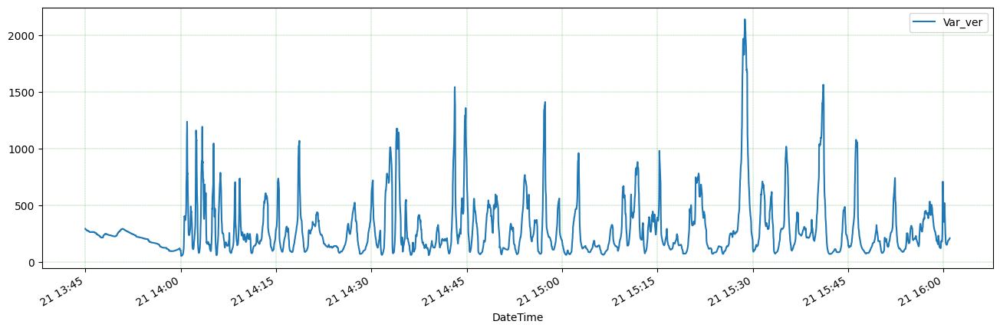

In [62]:
es1["2022-09-21 13:45":"2022-09-21 16:00"].plot( y='Var_ver', figsize=(16,5)) # part II of Volatile Move, on Price variance 20K / Price variance 20K 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.2)

In [63]:
es1.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1h', 'BA_St_1K', 'BA_St_5k', 'Prc_St_10', 'Prc_St_1h',
       'Prc_St_1k', 'MACD_3_6', 'MACD_7_12K', 'MACD_3_9', 'MACD_7_2K',
       'Shifted2K', 'Shifted30K', 'Vol_avg2h_PT', 'Vol_CumS_PT',
       'BA_CumSumPT4h', 'BA_CumSumPT1_3K', 'STD_200', 'AVG_200', 'AVG_200_Vol',
       'Price_R_BA_V', 'BA_Price_V', 'STD20K', 'MA30K', 'MA50K', 'MA70K',
       'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K', 'Var_MinMax_MA20K',
       'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val', 'Price_Target',
       'Price_Target5', 'B_A_CumSum', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr4K',
       'B_A_CumSumAvr10K'],
      dtype='object')

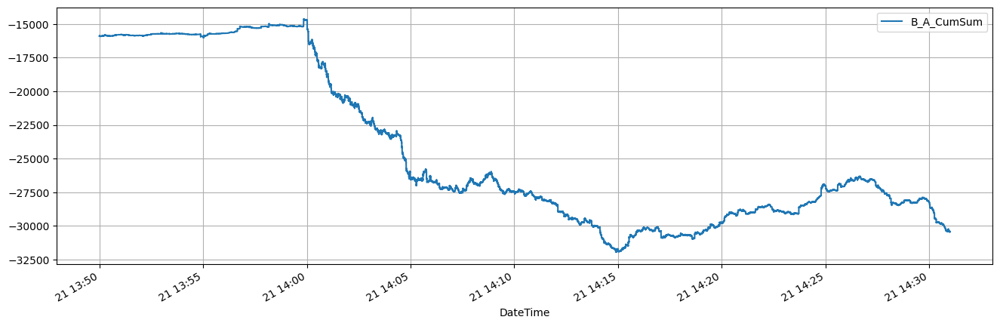

In [65]:
es1["2022-09-21 13:50":"2022-09-21 14:30"].plot( y='B_A_CumSum', figsize=(16,5))  # from 13 decisive decline of cummulative BidAsk Delta before the Volatile Move 
# IN SPITE THE FACT THAT PRICE HAD RETRACED AND SURPASSED HIGH OF DAY POINTS TO A DIVERGENCE BETWEEN BidAsk and Market Direction. Could this be a footprint of a Short Squeeze.
# tbd: is there such a Pattern when Price retraces in extremes of both directions, finishing on the Low of Day, while maintaining ratio of BidAsk in favor of the Low Direction 
# (and Opposite for Long Squeeze: BidAsk ratio should be positive while Price retraces  negative territory, just to finish the day on Positive?)
plt.grid() 

<AxesSubplot: xlabel='DateTime'>

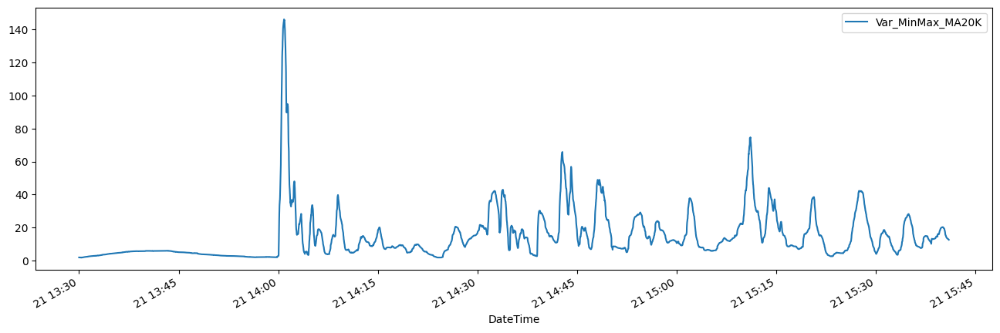

In [66]:
es1["2022-09-21 13:30":"2022-09-21 15:40"].plot( y='Var_MinMax_MA20K', figsize=(16,5)) 

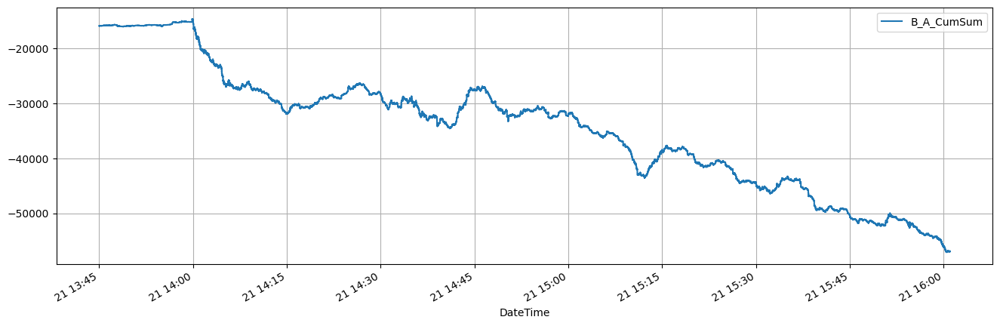

In [67]:
es1["2022-09-21 13:45":"2022-09-21 16:00"].plot( y='B_A_CumSum', figsize=(16,5))  # part II of the Volatility on last 100 ticks B_A_CumSum ratio 
# 14:40-14:45; 14:15-14:27; 15:10-15:15 there is generally steady increase of this ratio. What does Price do at that time? Seems that for short bursts of upword BA, Price advances much more, pointing to a Short Squeeze 
plt.grid()
plt.show()

Q: 14:40-14:45; 14:15-14:27; 15:10-15:15 there is steady increase of this ratio. What does Price do at that time?
A: about 85% decisive move up.
Conclusions: eventhough Delta continuosly drops, sporadic bursts of B_A_CumSum ratio push Price Upward, disproportionately more then the recovery of Delta. Possible predictive triger: if B_A_CumSum ratio declines, eventhough Price advances, chances are that the moves, in this example eventhough spectacularly large, are still part of a obscuring/hiding the eventual final direction of the move. In this instance its striking how 10-15% advance in B_A_CumSum ratio can produce 120% advancement of Price Upward (from daily move) only to return to a steady (already seen) decline of Price, correlated to eachother for the final Destination- super low end of day. 
TBExamined further!   (TBEF)

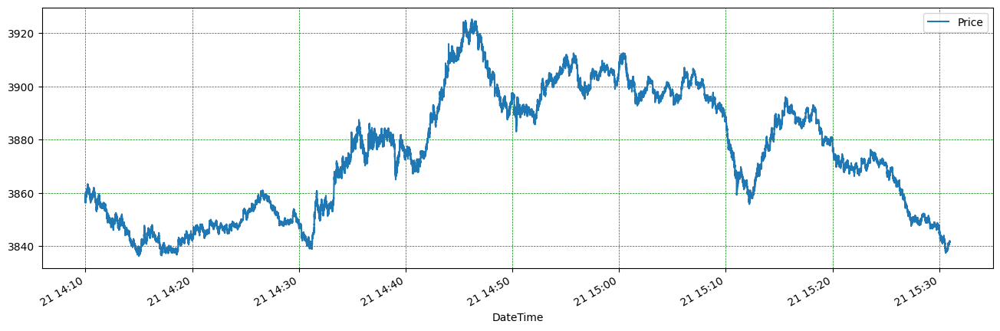

In [68]:
es1["2022-09-21 14:10":"2022-09-21 15:30"].plot( y='Price', figsize=(16,5))    #  part II Zoomed of the Volatile move 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)


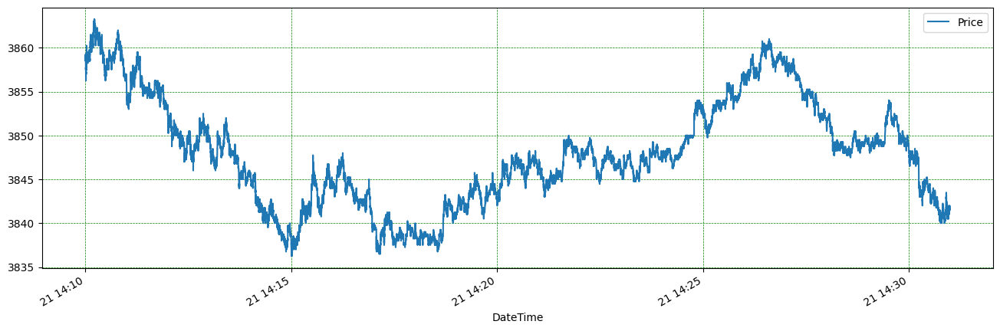

In [70]:
es1["2022-09-21 14:10":"2022-09-21 14:30"].plot( y=['Price' ], figsize=(16,5))    #  Averages BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

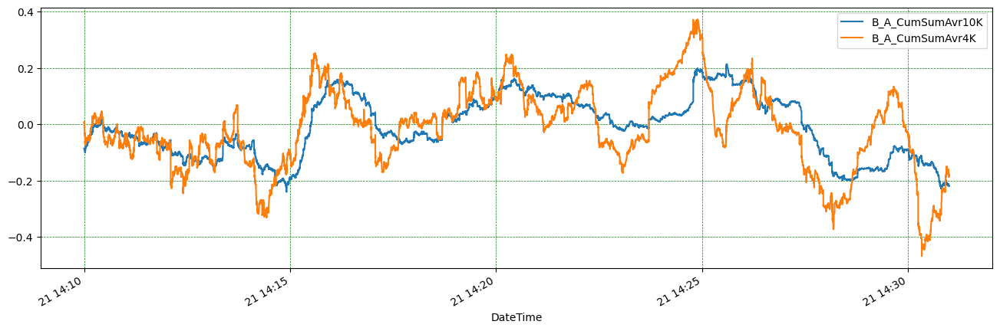

In [71]:
es1["2022-09-21 14:10":"2022-09-21 14:30"].plot( y=['B_A_CumSumAvr10K', 'B_A_CumSumAvr4K' ], figsize=(16,5))    #  BA CumSUm BA from 2 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

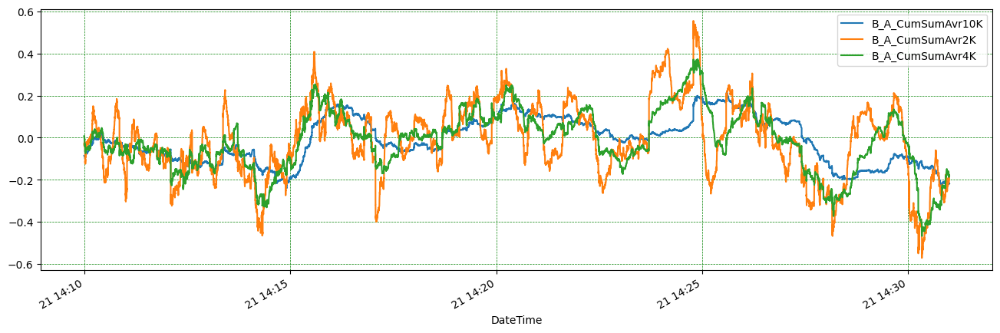

In [73]:
es1["2022-09-21 14:10":"2022-09-21 14:30"].plot( y=['B_A_CumSumAvr10K', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr4K' ], figsize=(16,5))    #  Averages BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

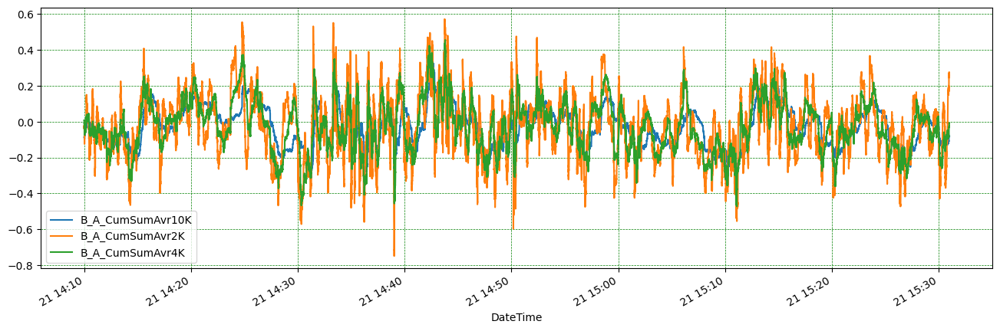

In [74]:
es1["2022-09-21 14:10":"2022-09-21 15:30"].plot( y=['B_A_CumSumAvr10K', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr4K' ], figsize=(16,5))    #  Averages BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

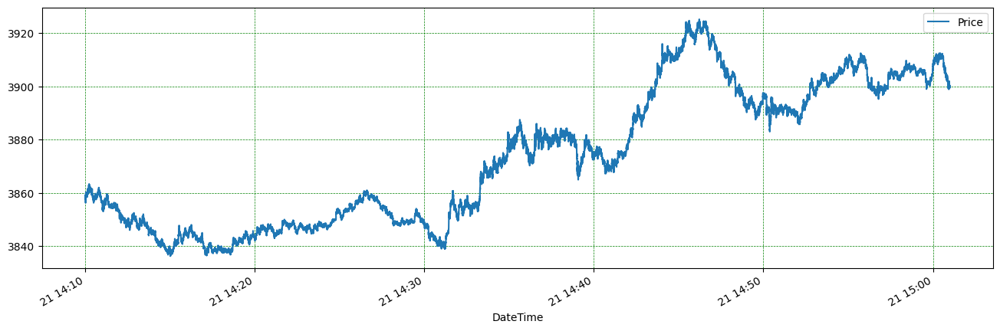

In [80]:
es1["2022-09-21 14:10":"2022-09-21 15:00"].plot( y=['Price'], figsize=(16,5))    #  30 min Zoom on few low-high cycle(s) of  BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

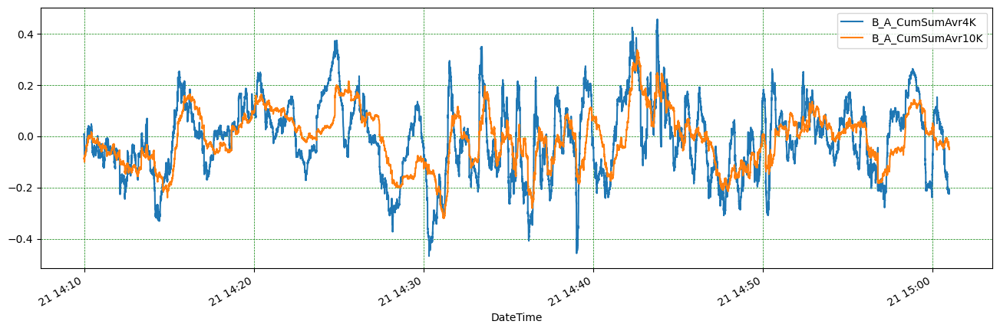

In [81]:
es1["2022-09-21 14:10":"2022-09-21 15:00"].plot( y=['B_A_CumSumAvr4K', 'B_A_CumSumAvr10K'], figsize=(16,5))    #  30 min Zoom on few low-high cycle(s) of  BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

#### Findings: BA cycles from low to high and vs do correspond to upward/downward moves by Price. Can low of 1 cycle be Start of Upward Move (and vs.)? 

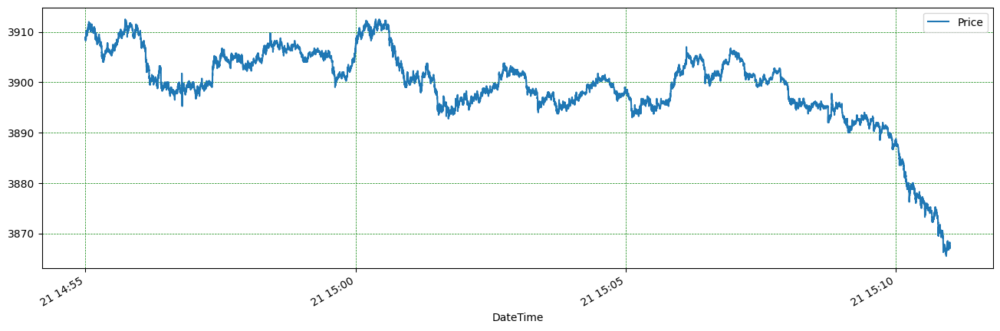

In [82]:
es1["2022-09-21 14:55":"2022-09-21 15:10"].plot( y='Price', figsize=(16,5))    #  Zoom on few 1-2 low-high cycle(s) of Price compared to higher plot cycles
# low-high cycle encompasses huge 55 pts move. At high/low of cycle (around 4-5-6) Price reverses. 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

In [83]:
es1.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1h', 'BA_St_1K', 'BA_St_5k', 'Prc_St_10', 'Prc_St_1h',
       'Prc_St_1k', 'MACD_3_6', 'MACD_7_12K', 'MACD_3_9', 'MACD_7_2K',
       'Shifted2K', 'Shifted30K', 'Vol_avg2h_PT', 'Vol_CumS_PT',
       'BA_CumSumPT4h', 'BA_CumSumPT1_3K', 'STD_200', 'AVG_200', 'AVG_200_Vol',
       'Price_R_BA_V', 'BA_Price_V', 'STD20K', 'MA30K', 'MA50K', 'MA70K',
       'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K', 'Var_MinMax_MA20K',
       'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val', 'Price_Target',
       'Price_Target5', 'B_A_CumSum', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr4K',
       'B_A_CumSumAvr10K'],
      dtype='object')

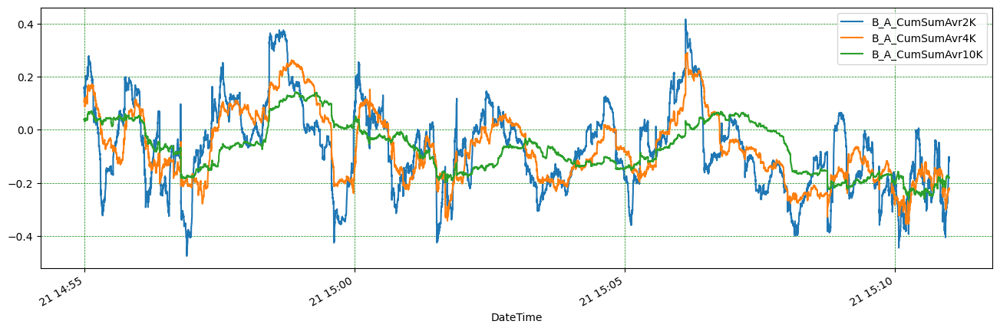

In [85]:
es1["2022-09-21 14:55":"2022-09-21 15:10"].plot( y=['B_A_CumSumAvr2K','B_A_CumSumAvr4K','B_A_CumSumAvr10K'], figsize=(16,5))    #  Zoom on 1-2 low-high cycle(s) of  BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

### Conclusion: When BA lingers 10-20-30 at extremes of cycle (3-4-5 or -3,-4,-5), not affecting Price very much, we are looking at possible exhaustion or end of 1 Direction of cycle.

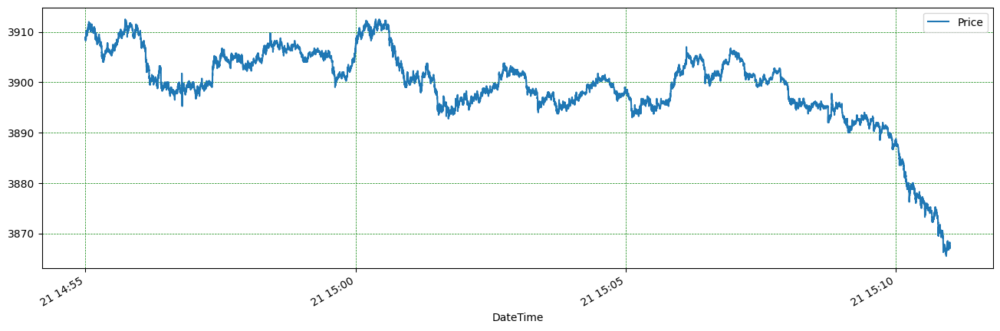

In [88]:
es1["2022-09-21 14:55":"2022-09-21 15:10"].plot( y='Price', figsize=(16,5))    #  15 min Zoom on few 1-2 low-high cycle(s) of Price compared to higher plot cycles
# low-high cycle encompasses huge 55 pts move. At high/low of cycle (around 4-5-6) Price reverses. 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

In [86]:
from sklearn.preprocessing import StandardScaler
import os
# from library.sb_utils import save_file
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

In [89]:
scaler = StandardScaler()
# scaled_tst4Corr = scaler.fit_transform(pd.DataFrame(es1[['Price', 'B_A_CumSum']]))

In [112]:
es1['Scld_Price'] = scaler.fit_transform(pd.DataFrame(es1['Price']))
es1['Scaled_B_A_CmSm'] = scaler.fit_transform(pd.DataFrame(es1['B_A_CumSum']))
es1['Scld_CumSumAvr10K'] = scaler.fit_transform(pd.DataFrame(es1['B_A_CumSumAvr10K']))
es1['Scld_B_A_CumSumAvr4K'] = scaler.fit_transform(pd.DataFrame(es1['B_A_CumSumAvr4K']))

In [144]:
es1.shape # (1814632, 51) to (1814632, 47)  after delition of scaled features
# del es1['Scld_B_A_CumSumAvr4K']
# del es1['Scld_CumSumAvr10K']
# del es1['Scaled_B_A_CmSm']
# del es1['Scld_Price']

(1814632, 47)

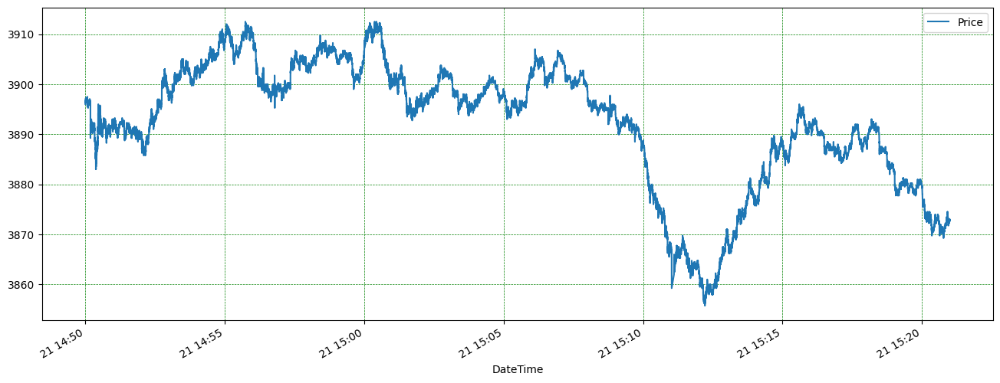

In [113]:
es1["2022-09-21 14:50":"2022-09-21 15:20"].plot( y=['Price'], figsize=(16,6))    # Interesting: 30 min Zoomed part II of the most Volatile move
# of 4 scaled features, including scaled Price, 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

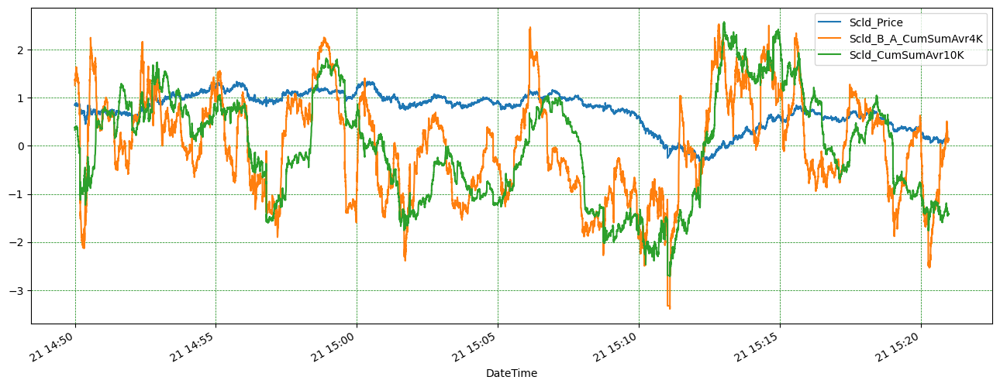

In [114]:
es1["2022-09-21 14:50":"2022-09-21 15:20"].plot( y=['Scld_Price' ,'Scld_B_A_CumSumAvr4K', 'Scld_CumSumAvr10K'], figsize=(16,6))    # Interesting: 30 min Zoomed part II of the most Volatile move
# of 2 scaled features, including scaled Price; Cyclicity at extremes, including Divergence at extremes points at potential direction of Price within the Cycle, 
# Tranistion below/above 0 also points at a Direction. What happens when Price can not follow extremes of Cycle? Exhaustion of Cycle may be the answer with Reversal folowing.
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

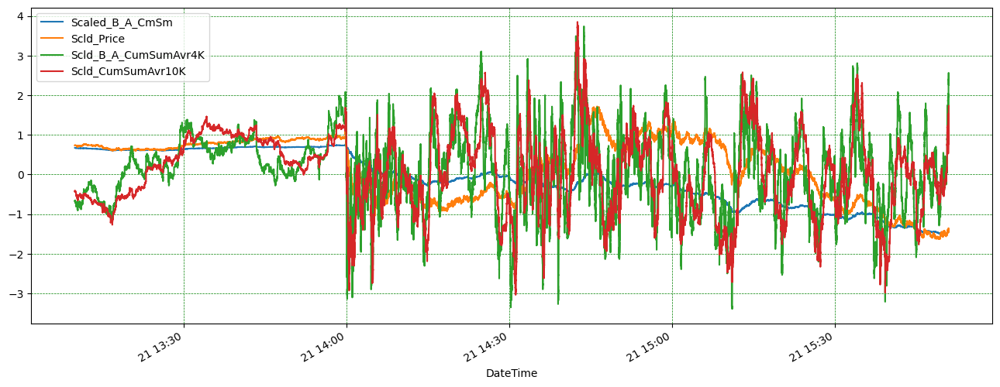

In [115]:
es1["2022-09-21 13:10":"2022-09-21 15:50"].plot( y=['Scaled_B_A_CmSm','Scld_Price' ,'Scld_B_A_CumSumAvr4K', 'Scld_CumSumAvr10K'], figsize=(16,6))    # Interesting: part II of the most Volatile move
# of 4 scaled features, including scaled Price, 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

Findings: There is correlation between Delta B_A_CumSum and Price. However, the ratio of increase is disproportional, in this extreme example. While Price advances at 14:30 in the extremes, there is still a static or moderate increase of BidAsk ratio. That could be a footprint of a ShortSqueeze: when shares change hands, from retail to intitutional: if retail tr. generally expected downturn direction and positioned shorts, InstitutionalFunds (IF) are rasing the Price, chasing retailers from shorts, on smaller Volume, retailers raise the Price while liquidating their loosing short positions, while IF aquare that liquidity, positioning into Longs and Shorts, all in a span of 15 minutes; only to slam Price and reconfirm the downward trend, initially correctly imagined by retailers (yet at the end mostly without as large retail participation), within the next 1:30 min.   
The chart of line intersection may also be a Triger for ShortSqueeze in action. TBFE 

Showing the Price_Target vs Price shifted in future 30 seconds and 5 min

<AxesSubplot: xlabel='DateTime'>

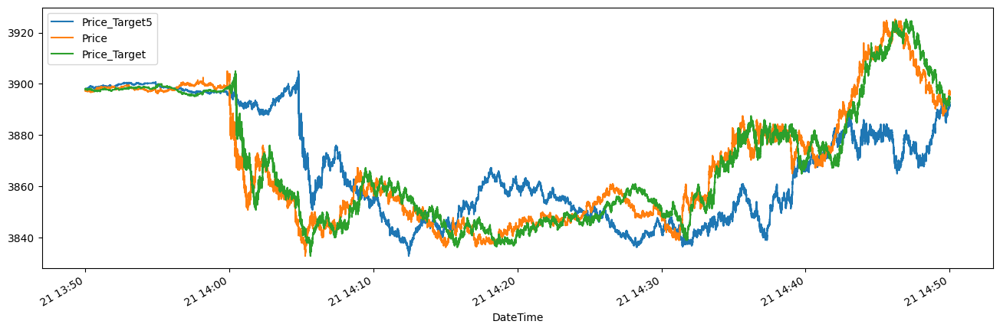

In [116]:
es1["2022-09-21 13:50:00":"2022-09-21 14:50:00"].plot( y= ['Price_Target5','Price', 'Price_Target'], figsize=(16,5))  
#  Target_Price shifted aprox 30 sec; Target_Price5 shifted 5 min into the future

Observation: Once Price falls unusual 60 pnts within 5 minutes, a spectacular volatility, and "settles" within a 45 pnts range for 25-30 min, it brakes Upward, climbing almost 100 pnts (from lowest point) within 15 min, even more volatile Upward move, only to slam it down "All Force", some 120+ points within the last 1:10 hr of trading. Why? Is there any particular signature as to: Spread (variation), mean, Volume, Time during which these changes occured?    

14:18 and 14:34 Big Spikes  in Vol_avg100 aggregate of 100 ticks Volume, 

Possible Lead: High Price_R_BA_V on 14:47 and 15:02 may indicate greater participation of 'Big Money' - remains to be seen how Price_R_BA_V may relate to it. During the ensuing Price decline, there is intense greater Price_R_BA_V Spread, which settles towards the end with another (end-of-day Volume settling) Spike at 15:55 after which another 20 pnts decline. 


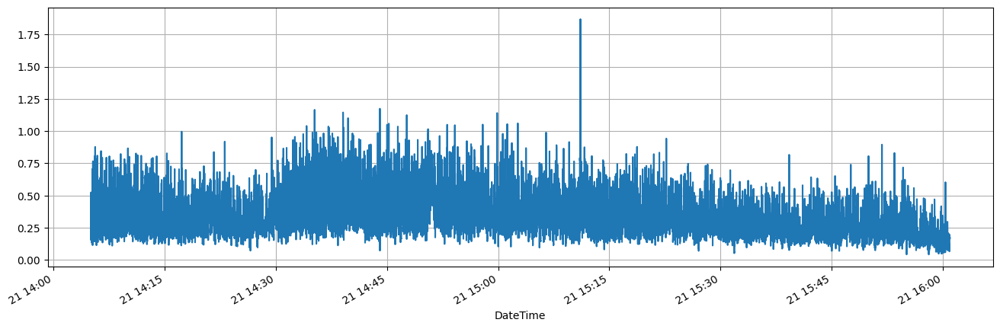

In [117]:
es1["2022-09-21 14:05":"2022-09-21 16:00"]['Price_R_BA_V'].plot( y='Price', figsize=(16,5)) # plot in volatile hour from 200 rows calc of Price * STD / mean  ratio
plt.grid()

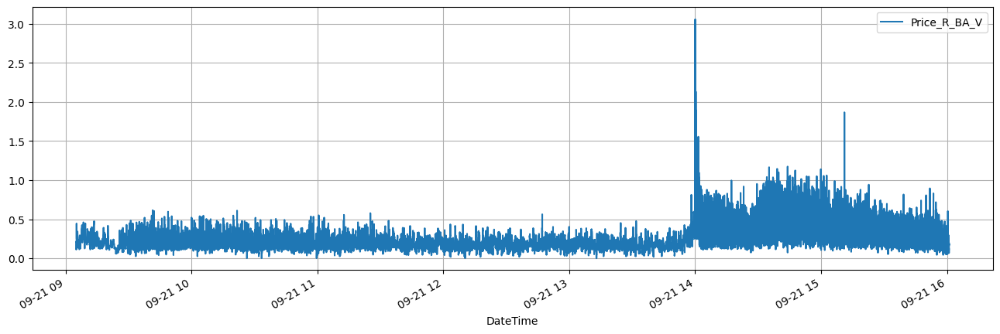

In [105]:
es1["2022-09-21 09:05":"2022-09-21 16:00"].plot( y='Price_R_BA_V', figsize=(16,5)) # plot in volatile hour of Price_R_BA_V
plt.grid()

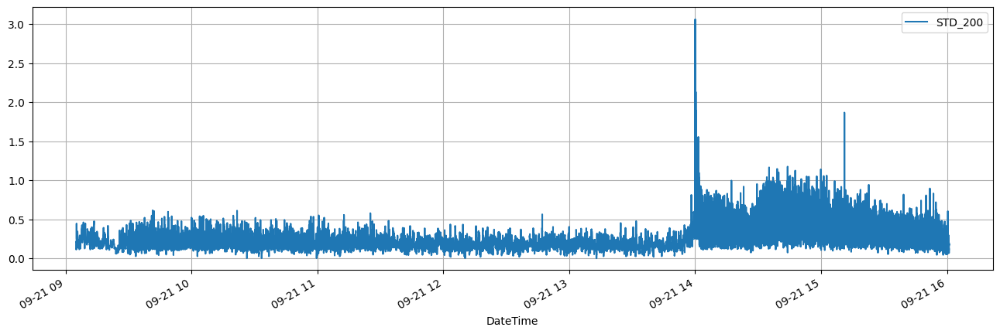

In [106]:
es1["2022-09-21 09:05":"2022-09-21 16:00"].plot( y=['STD_200'], figsize=(16,5)) # plot in volatile hour of STD_200
plt.grid()

<AxesSubplot: xlabel='DateTime'>

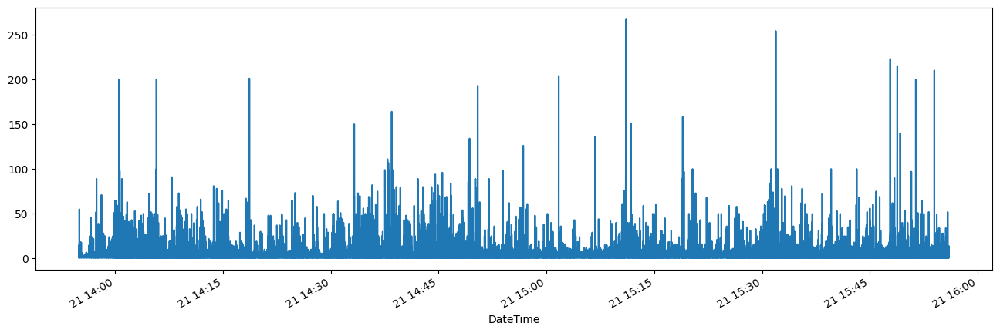

In [107]:
es1["2022-09-21 13:55":"2022-09-21 15:55"]['Vol'].plot( figsize=(16,5))

<AxesSubplot: xlabel='DateTime'>

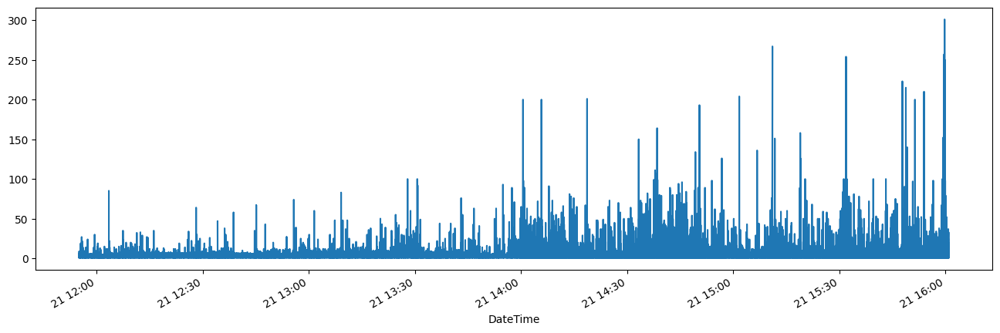

In [108]:
es1["2022-09-21 11:55":"2022-09-21 16:00"]['Vol'].plot( figsize=(16,5))

In [145]:
es1.to_csv('ES_Aug21_drv3.csv')

Possible lead: Spikes at Times after which 5-10 min later, great Volatility follows upward or downward. Of course, its common greater Volatility to be correlated with greater Volume, since that Volume fluctuation creates the Volatility. But can the Volume Spikes ahead (2-10 min) relate to or predict a possible Change? Can it be translated as: 'parking' the funds in a range or Accumulation for a possible distribution later? 

What is the story with Vol in the preceeding times? Can a period of preparation be deduced to exist with specific changes happenning ahead of a move?

In [ ]:
# for future use...
# val_5 = es.rolling('5T').Vol.sum() # (1814632,) 
# val_5.shape  # (1814632,)
# val_5.max()


### PCA

In [2]:
es1.sample(9)

NameError: name 'es1' is not defined

In [169]:
# Create a new dataframe, `es__scale` from `es1` 
es__scale = es1.copy()
# Save the labels (using the index attribute of `es1`) into the variable 'es_index'
es_index = es1.index
# # Save the column names (using the `columns` attribute) of `es1` into the variable 'es_columns'
es_columns = es1.columns


In [171]:
es__scale.shape  # (1814632, 47)

(1814632, 47)

In [175]:
es__scale.head(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1h,BA_St_1K,BA_St_5k,Prc_St_10,Prc_St_1h,Prc_St_1k,MACD_3_6,MACD_7_12K,MACD_3_9,MACD_7_2K,Shifted2K,Shifted30K,Vol_avg2h_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT1_3K,STD_200,AVG_200,AVG_200_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,B_A_CumSumAvr2K,B_A_CumSumAvr4K,B_A_CumSumAvr10K
DateTime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-09-21 00:00:00.720,1,-1,3879.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3879.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,-1,0.0,0.0,0.0
2022-09-21 00:00:00.720,1,-1,3879.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3879.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,-2,0.0,0.0,0.0
2022-09-21 00:00:00.900,1,1,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,-1,0.0,0.0,0.0
2022-09-21 00:00:00.900,1,1,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0,0.0,0.0,0.0
2022-09-21 00:00:00.900,1,1,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,1,0.0,0.0,0.0
2022-09-21 00:00:00.900,1,1,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,2,0.0,0.0,0.0
2022-09-21 00:00:03.084,1,-1,3879.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3879.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,1,0.0,0.0,0.0
2022-09-21 00:00:03.092,1,-1,3879.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3879.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0,0.0,0.0,0.0
2022-09-21 00:00:07.944,1,1,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3879.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,1,0.0,0.0,0.0


In [176]:
es__scale = es__scale.fillna(0)
es__scale = es__scale[np.isfinite(es__scale).all(1)]  # to get rid of Infinite values 

In [178]:
es__scale.shape  #    (1808952, 47)

(1808952, 47)

In [180]:
es__scale.sample(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1h,BA_St_1K,BA_St_5k,Prc_St_10,Prc_St_1h,Prc_St_1k,MACD_3_6,MACD_7_12K,MACD_3_9,MACD_7_2K,Shifted2K,Shifted30K,Vol_avg2h_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT1_3K,STD_200,AVG_200,AVG_200_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,B_A_CumSumAvr2K,B_A_CumSumAvr4K,B_A_CumSumAvr10K
DateTime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-09-21 11:04:12.016,1,1,3890.00,130.0,144.0,-75.0,-535.0,-129.131313,-37.967212,-16.468002,40.0,49.666667,37.344444,42.333333,40.288690,69.805556,30.767857,3889.25,3890.25,-123.500,-247.00,20.60850,11.340254,0.191267,3889.81500,1.235,0.191276,3890.000,1.269310,3891.642325,3891.824705,3893.169193,3895.191218,3895.897780,3894.669528,0.004100,1.608252,60.174884,-2813.756414,89.679933,17513.0,3890.75,3903.75,-13739,-0.0375,-0.15375,-0.1193
2022-09-21 15:07:06.700,1,-1,3904.50,-73.0,29.0,-29.0,-294.0,-128.969697,-34.224625,-16.218321,90.0,60.800000,52.676923,-34.125000,76.056548,-1.277778,202.485714,3901.50,3895.25,-155.250,-310.50,62.03575,45.544393,0.388068,3905.21250,1.035,0.387997,-3904.500,3.662104,3898.831633,3900.319345,3901.092868,3902.026145,3903.106453,3895.313730,0.005799,13.362948,106.654966,-4058.340664,261.733896,31573.0,3895.50,3909.50,-35449,-0.0145,-0.05400,0.0521
2022-09-21 14:01:52.176,1,1,3870.00,-76.0,221.0,438.0,-72.0,-152.872727,-33.807455,-12.910654,60.0,37.400000,63.911765,-14.416667,84.160714,2.722222,321.873214,3861.50,3902.00,-198.625,-397.25,40.78200,65.768814,0.405240,3870.50625,1.135,0.405187,3870.000,5.840294,3868.614667,3880.415715,3883.814743,3886.020455,3889.954275,3890.470292,0.044695,33.906518,125.139408,-11742.694730,930.625076,47304.0,3857.25,3891.75,-20391,0.2190,0.02425,-0.0320
2022-09-21 09:40:48.340,2,-1,3890.25,-48.0,-97.0,-208.0,-303.0,-467.878788,-55.179880,-44.229467,10.0,28.000000,43.062500,18.791667,-43.877976,-4.833333,-48.457143,3891.00,3889.50,-129.000,-258.00,5.84500,1.669343,0.291071,3890.55375,1.290,0.291048,-1945.125,1.475121,3889.338467,3891.706065,3892.249268,3891.895808,3882.965749,0.000000,0.002892,2.172489,70.301744,-3139.809660,120.308936,24716.0,3887.25,3893.00,-5845,-0.1040,-0.07150,-0.0221
2022-09-21 16:06:21.456,6,1,3805.50,37.0,323.0,489.0,104.0,-245.333333,-68.067668,-19.259009,0.0,38.500000,63.366667,1.291667,39.139881,12.138889,93.335714,3803.00,3805.00,-92.250,-184.50,42.12375,85.245716,0.147588,3805.65375,1.845,0.147582,634.250,1.621385,3803.052375,3805.454820,3807.806525,3811.604247,3818.478773,3829.915761,0.013656,2.624398,91.013887,-3862.057546,45.416918,26458.0,3805.75,3818.25,-56165,0.2445,0.08750,0.0095
2022-09-21 15:45:19.500,1,1,3817.50,-16.0,13.0,-131.0,-706.0,-167.649832,-66.856456,-23.212915,0.0,47.333333,50.533333,-16.416667,31.916667,6.277778,68.850000,3817.00,3824.25,-146.500,-293.00,76.43250,21.127216,0.316774,3818.11250,1.465,0.316723,3817.500,3.611834,3825.255792,3827.427730,3831.938000,3834.465277,3851.241735,3861.659837,0.018561,12.993424,137.664276,-5469.952929,349.308262,39147.0,3825.00,3843.25,-50955,-0.0655,-0.09425,-0.1690
2022-09-21 14:23:40.908,1,1,3846.00,-27.0,-12.0,-146.0,-233.0,-124.181818,-32.370771,-27.587144,0.0,24.750000,54.035714,-49.916667,64.458333,-19.555556,60.112500,3847.75,3838.00,-183.750,-367.50,72.72500,5.990622,0.626222,3846.53250,1.050,0.626136,3846.000,1.511693,3844.877475,3843.622000,3843.419732,3846.923783,3848.919447,3860.025696,0.011221,2.280467,133.984463,1539.370202,36.606851,31755.0,3848.50,3853.50,-29090,-0.0730,-0.05975,-0.0129
2022-09-21 14:05:30.608,1,2,3843.75,52.0,53.0,6.0,432.0,-104.949495,-56.556290,-12.532030,50.0,41.500000,43.755556,-2.375000,29.211310,15.055556,72.894643,3841.25,3852.50,-140.000,-280.00,46.39075,32.349462,0.307259,3843.26125,1.120,0.307298,7687.500,3.109708,3844.657308,3850.018775,3855.075654,3860.495572,3877.361592,3882.075743,0.056314,9.633840,159.996497,-591

In [181]:
import os
# from library.sb_utils import save_file
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

In [182]:
scaler1 = StandardScaler()
es__scaled = scaler1.fit_transform(es__scale)

In [186]:
es_scaled_df = pd.DataFrame(es__scaled, columns= es_columns)
es_scaled_df.sample(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1h,BA_St_1K,BA_St_5k,Prc_St_10,Prc_St_1h,Prc_St_1k,MACD_3_6,MACD_7_12K,MACD_3_9,MACD_7_2K,Shifted2K,Shifted30K,Vol_avg2h_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT1_3K,STD_200,AVG_200,AVG_200_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,B_A_CumSumAvr2K,B_A_CumSumAvr4K,B_A_CumSumAvr10K
36224,-0.169133,-0.858676,-0.088109,-0.750970,-1.183403,-1.104036,-1.425432,-0.674429,0.873852,1.286140,1.042645,0.486266,-0.815981,-0.525418,-1.570900,-0.896953,-1.374619,0.030002,0.156435,-1.720013,-1.720013,-1.152387,-0.617989,0.913219,-0.041917,0.904915,0.912989,-0.903659,0.408299,0.139349,-5.924107,-4.980159,-4.131771,-2.836661,-2.244207,-0.962675,0.127753,-0.425565,0.535281,-0.694987,-1.230166,0.080316,-4.645991,1.441548,-1.104036,-1.623715,-0.832231
1009307,-0.169133,0.914006,0.098597,-1.573357,-1.907212,-3.089445,-2.461676,0.301365,-0.400803,0.993773,-0.871634,0.950408,0.997850,-0.676924,-0.686925,-0.754741,-1.227203,0.090245,0.130178,-0.398824,-0.398824,0.408745,1.548615,0.577567,0.074103,-0.768399,0.577459,0.962026,0.149054,0.147848,0.173567,0.195447,0.232477,0.337674,0.431302,1.056710,-0.085633,-0.825460,-0.768464,0.233662,1.413494,0.136349,0.188431,-0.284036,-3.089445,-2.867366,-2.045156
821004,-0.169133,0.914006,-0.342030,-1.380726,-0.699297,-0.127852,-0.413940,-0.560663,0.286721,0.595347,-0.871634,-1.230586,0.706706,-1.837497,-0.309732,-1.710719,0.326313,-0.060363,0.109981,0.775739,0.775739,0.752729,-0.020134,-0.673455,-0.204169,-0.367357,-0.673546,0.958469,-0.580152,0.112849,0.147953,0.177867,0.220040,0.345875,0.445789,-0.138275,-0.542525,-0.674966,0.052895,-0.529658,0.923768,0.022351,0.177759,-0.038338,-0.127852,-0.220770,-0.461848
111900,0.346107,-0.858676,0.270367,0.634494,-0.116490,-1.470481,-1.976555,-1.326260,0.251403,0.337640,-0.871634,-0.271517,-0.891936,1.699580,0.635734,1.792427,-0.057295,0.095893,0.142802,0.813176,0.813176,-0.988862,-0.669247,-0.541877,0.176765,-0.477989,-0.541814,-0.439062,0.306838,0.150031,0.179477,0.204153,0.243570,-2.836661,-2.244207,-0.366965,0.041662,-0.490793,-0.074228,-0.472947,-1.143881,0.122824,0.219505,1.283651,-1.470481,-1.558462,-1.593981
448848,-0.169133,-0.858676,0.688590,-0.358298,-1.695709,-1.599637,-0.846258,-0.162883,-1.163852,-2.899780,-0.871634,2.001831,-0.750178,-0.244744,-0.950721,-0.589223,-0.528376,0.216380,0.178651,1.114226,1.114226,-1.135741,-0.587454,-1.088506,0.444293,-0.215237,-1.088484,-0.909930,-1.238366,0.176093,0.205596,0.233585,0.270535,0.372110,0.460211,-0.772299,-0.775963,0.006008,-0.210088,-0.390531,-0.802071,0.157603,0.249010,0.856291,-1.599637,-1.195731,-0.314954
274205,-0.169133,0.914006,0.882765,0.175142,0.066812,0.241596,-0.963413,-1.955820,0.318061,-1.248377,-0.871634,0.723073,-1.640357,-0.195213,-0.688036,-0.570261,-0.283112,0.257797,0.170573,0.803816,0.803816,-1.168886,-0.600393,-0.317305,0.568727,-0.450331,-0.317278,0.968357,-0.969598,0.184727,0.207649,0.231262,0.267713,0.366080,-2.244207,-0.773401,-0.701227,-0.256643,0.033583,-0.544379,-0.403201,0.186585,0.247754,1.218596,0.241596,-0.975021,-0.557329
1034749,-0.169133,0.914006,0.449606,0.730810,-0.177591,-0.187925,0.432545,1.256381,-0.116288,0.428689,-0.871634,0.853317,-0.100972,0.157329,0.314538,0.028608,-0.147201,0.148606,0.149366,-0.776307,-0.776307,0.429718,0.807620,1.800667,0.287413,-0.713083,1.801014,0.964860,-0.678141,0.151448,0.184825,0.209621,0.239914,0.340299,0.432704,1.322771,-0.588024,-0.504992,-0.686688,0.160278,1.738845,0.113163,0.192511,-0.307561,-0.187925,-0.186224,-0.003329
878768,0.346107,-0.858676,-0.797595,0.204778,0.433416,1.253824,0.272489,0.187714,0.953410,0.453973,0.723599,0.320501,-0.088778,-0.438011,1.496737,0.226124,1.972237,-0.197794,0.066558,0.201716,0.201716,0.526953,0.588459,-0.341775,-0.489738,-0.671596,-0.341985,-0.434751,-0.104600,0.074547,0.127727,0.170329,0.219195,0.335457,0.439096,-0.063568

In [187]:
es_scaled_df.mean()

Vol                 4.072472e-17
BidAsk             -6.523497e-17
Price              -1.914565e-15
BA_5h              -2.589288e-17
BA_1K              -1.256936e-19
BA_2K               1.106104e-17
BA_5K               1.860265e-17
BA_St_1h            5.417394e-16
BA_St_1K            4.243416e-16
BA_St_5k            9.200771e-16
Prc_St_10           2.601857e-16
Prc_St_1h          -4.700626e-16
Prc_St_1k          -3.840442e-15
MACD_3_6            2.136791e-17
MACD_7_12K         -2.664704e-17
MACD_3_9           -1.734572e-17
MACD_7_2K           2.589288e-17
Shifted2K           1.729795e-15
Shifted30K          3.986058e-16
Vol_avg2h_PT        7.918696e-17
Vol_CumS_PT         7.560470e-17
BA_CumSumPT4h      -1.518379e-16
BA_CumSumPT1_3K     3.061896e-16
STD_200            -1.292633e-15
AVG_200             2.460377e-14
AVG_200_Vol         1.949256e-15
Price_R_BA_V        9.238479e-16
BA_Price_V         -1.734572e-17
STD20K             -9.743767e-16
MA30K              -3.781806e-15
MA50K     

In [188]:
es_scaled_df.sample(6)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1h,BA_St_1K,BA_St_5k,Prc_St_10,Prc_St_1h,Prc_St_1k,MACD_3_6,MACD_7_12K,MACD_3_9,MACD_7_2K,Shifted2K,Shifted30K,Vol_avg2h_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT1_3K,STD_200,AVG_200,AVG_200_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,B_A_CumSumAvr2K,B_A_CumSumAvr4K,B_A_CumSumAvr10K
1280868,-0.169133,0.914006,1.054535,0.108462,0.800021,1.473090,0.721307,0.613390,0.859733,1.148964,1.361692,-0.318879,0.201529,0.159271,0.473061,-0.029067,1.657818,0.242736,0.189760,-0.300554,-0.300554,0.595524,2.964406,0.982492,0.668013,-0.892861,0.982932,0.969744,-0.287031,0.187834,0.217995,0.242532,0.277226,0.377756,0.460190,-0.624965,-0.383529,-0.673543,-0.854574,0.822105,-0.007733,0.180789,0.263135,-0.493545,1.473090,1.020961,0.055428
1075518,-0.169133,0.914006,0.598971,1.953277,1.288827,1.536167,2.625487,1.632809,0.650210,1.285134,-0.871634,-0.342559,0.304890,0.897376,-0.130050,0.949428,-0.132029,0.195671,0.127654,-1.375287,-1.375287,0.358345,-0.345673,1.379444,0.396563,-0.049289,1.379128,0.966066,1.970483,0.145518,0.181440,0.211373,0.249871,0.345995,0.435852,-0.608506,1.966856,-0.470023,1.050668,-0.545178,0.781777,0.092875,0.223586,-0.227503,1.536167,2.886436,3.095085
1399058,-0.169133,-0.858676,0.098597,-0.439796,-1.963612,-1.509528,-2.073909,-0.329916,-0.169911,0.847274,0.085505,-0.378081,0.699173,-1.164462,-0.414304,-0.966874,-0.410976,0.077067,0.176632,-1.353450,-1.353450,1.955624,-0.488919,0.790360,0.082137,1.126180,0.789951,-0.905166,1.564165,0.162167,0.194216,0.215445,0.251125,0.367035,0.460044,0.395374,1.396232,0.675723,-0.178693,-0.330025,0.098961,0.113163,0.206008,-0.797516,-1.509528,-2.406755,-1.396724
1534992,-0.169133,-0.858676,-1.223286,0.575223,1.274726,0.232585,-0.737354,0.387465,0.906059,-1.073616,-0.233541,-0.129433,0.598906,0.780833,1.080439,0.950613,0.713223,-0.282511,0.078676,0.377979,0.377979,0.334456,-0.375730,-0.451564,-0.765918,-0.312041,-0.451657,-0.894494,0.703935,0.063854,0.122326,0.159914,0.210901,0.342773,0.443082,-0.095373,0.402839,-0.237220,-1.839799,2.374609,0.332797,-0.071359,0.186861,-1.308596,0.232585,-0.894414,-2.130144
439900,-0.169133,-0.858676,0.725932,-0.313845,-0.586496,-0.386165,0.122332,-2.789263,-0.587232,-0.925907,-0.871634,3.422674,-0.187619,0.626414,-0.218430,0.581653,-0.533990,0.214497,0.177642,1.402797,1.402797,-0.974122,-0.461817,-1.470574,0.469703,0.683651,-1.470573,-0.910231,-0.951553,0.177103,0.207241,0.235587,0.271099,0.372086,0.460217,-0.797419,-0.695130,-0.223695,-0.247113,-0.335539,-0.894318,0.164365,0.248696,0.888458,-0.386165,0.024889,-0.207932
1122422,-0.169133,-0.858676,1.644528,0.886396,1.133725,1.437047,0.259288,-0.036145,1.322813,0.883725,0.883122,0.841476,-0.715260,-0.249600,1.331726,0.571777,1.464659,0.404641,0.206422,-0.052539,-0.052539,0.508942,0.648049,0.493514,1.054651,-0.796057,0.493523,-0.917647,0.652811,0.222882,0.227675,0.238088,0.266065,0.357529,0.441362,2.908481,0.353041,1.005171,2.103549,0.644660,1.367810,0.274499,0.215425,0.012013,1.437047,0.711967,0.589493


In [189]:
es_scaled_df.std()

Vol                 1.0
BidAsk              1.0
Price               1.0
BA_5h               1.0
BA_1K               1.0
BA_2K               1.0
BA_5K               1.0
BA_St_1h            1.0
BA_St_1K            1.0
BA_St_5k            1.0
Prc_St_10           1.0
Prc_St_1h           1.0
Prc_St_1k           1.0
MACD_3_6            1.0
MACD_7_12K          1.0
MACD_3_9            1.0
MACD_7_2K           1.0
Shifted2K           1.0
Shifted30K          1.0
Vol_avg2h_PT        1.0
Vol_CumS_PT         1.0
BA_CumSumPT4h       1.0
BA_CumSumPT1_3K     1.0
STD_200             1.0
AVG_200             1.0
AVG_200_Vol         1.0
Price_R_BA_V        1.0
BA_Price_V          1.0
STD20K              1.0
MA30K               1.0
MA50K               1.0
MA70K               1.0
MA100K              1.0
MA200K              1.0
MA300K              1.0
Var_Vol_100K        1.0
Var_MinMax_MA20K    1.0
Var_ver             1.0
BA_Vol_Avg40K       1.0
BA_BA_Avg40K        1.0
5_val               1.0
Price_Target    

In [190]:
es_pca = PCA().fit(es_scaled_df)

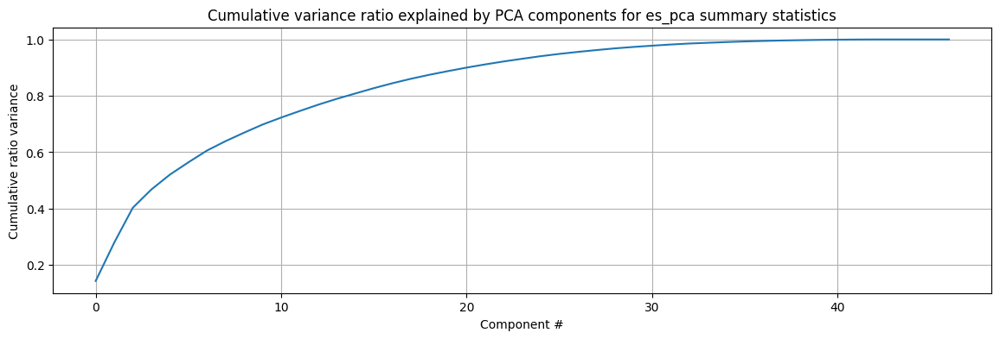

In [197]:
plt.subplots(figsize=(14, 4))
plt.plot(es_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for es_pca summary statistics')
plt.grid()

- Conclusion: Looks like 30 features account for 98% of all components. About 15 features account for 80%; 

In [198]:
es_pca_x = es_pca.transform(es__scaled)

c:\Users\tonya\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


In [199]:
es_pca_x.shape  # (1808952, 47)

(1808952, 47)

In [200]:
es_pca_x

array([[-1.30141156e+00,  1.69261952e+01,  9.58772212e+00, ...,
         2.20166741e-04, -5.05989265e-14, -7.48415772e-15],
       [-1.30140128e+00,  1.69261761e+01,  9.58773220e+00, ...,
         2.20166626e-04, -5.05989265e-14, -7.48415772e-15],
       [-1.51872110e+00,  1.68472454e+01,  9.67178855e+00, ...,
         3.49188192e-04, -5.01548373e-14, -7.51191329e-15],
       ...,
       [ 6.93264121e-01, -8.52986468e-01,  1.38590491e+00, ...,
        -2.02448345e-04, -2.20146212e-16, -1.91422485e-15],
       [ 6.94739712e-01, -8.56172939e-01,  1.42129058e+00, ...,
        -2.01609911e-04, -2.75160862e-16, -1.91379870e-15],
       [ 6.92675331e-01, -8.59113665e-01,  1.44408189e+00, ...,
        -1.99861969e-04, -3.30455172e-16, -1.91379870e-15]])

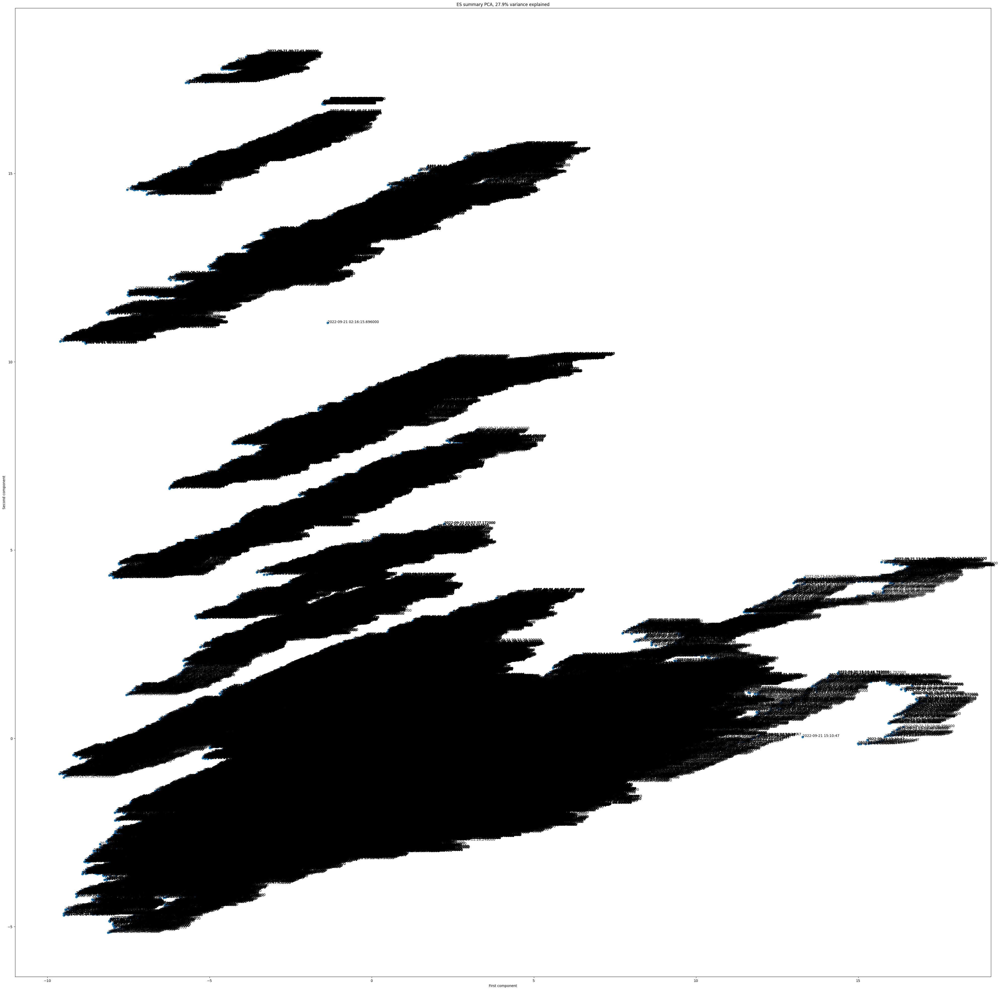

In [201]:
x = es_pca_x[:, 0]
y = es_pca_x[:, 1]
esx = es_index
pc_var = 100 * es_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(50,50))
plt.scatter(x=x, y=y)
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'ES summary PCA, {pc_var:.1f}% variance explained')
for s, x, y in zip(esx, x, y):
    plt.annotate(s, (x, y))

In [196]:
plt.subplots(figsize=(40,40))
sns.heatmap(es1.corr(), linewidths=.2);

In [206]:
es1.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1h', 'BA_St_1K', 'BA_St_5k', 'Prc_St_10', 'Prc_St_1h',
       'Prc_St_1k', 'MACD_3_6', 'MACD_7_12K', 'MACD_3_9', 'MACD_7_2K',
       'Shifted2K', 'Shifted30K', 'Vol_avg2h_PT', 'Vol_CumS_PT',
       'BA_CumSumPT4h', 'BA_CumSumPT1_3K', 'STD_200', 'AVG_200', 'AVG_200_Vol',
       'Price_R_BA_V', 'BA_Price_V', 'STD20K', 'MA30K', 'MA50K', 'MA70K',
       'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K', 'Var_MinMax_MA20K',
       'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val', 'Price_Target',
       'Price_Target5', 'B_A_CumSum', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr4K',
       'B_A_CumSumAvr10K'],
      dtype='object')

In [207]:
ar = ['Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1h', 'BA_St_1K', 'BA_St_5k', 'Prc_St_10', 'Prc_St_1h',
       'Prc_St_1k', 'MACD_3_6', 'MACD_7_12K', 'MACD_3_9', 'MACD_7_2K', 'BA_CumSumPT4h', 'BA_CumSumPT1_3K', 'STD_200', 'AVG_200', 'AVG_200_Vol',
       'Price_R_BA_V', 'BA_Price_V', 'STD20K', 'MA30K', 'MA50K', 'MA70K',
       'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K', 'Var_MinMax_MA20K',
       'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val', 'B_A_CumSum', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr4K',
       'B_A_CumSumAvr10K' ]

Text(0.5, 1.0, 'Correlations in ES data')

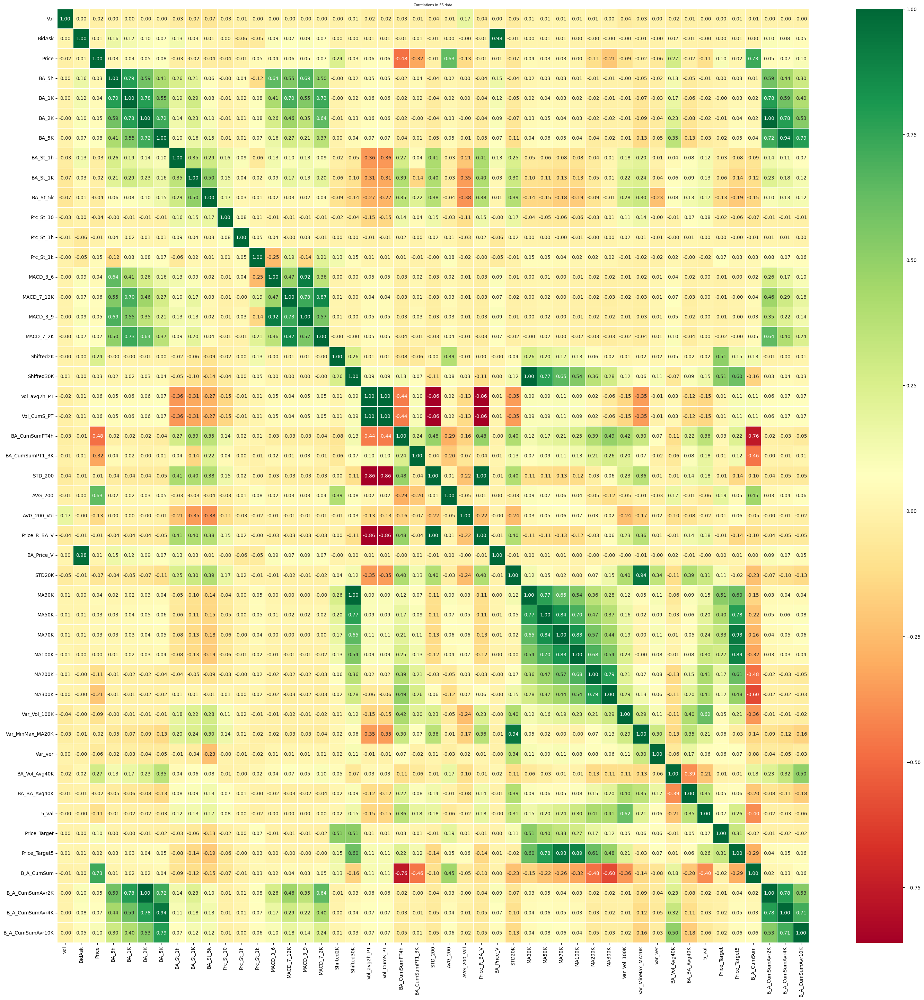

In [202]:
# seaborn heatmap of correlations in es data
plt.subplots(figsize=(35,35))
# Using numpy ‘.tril()’ method to take the upper correlation matrix and mask attribute: to create an upper triangle matrix.
#matrix = np.tril(es1.corr())
#sns.heatmap(ski_data.corr(), linewidths=.1, annot=True, cmap='coolwarm', center=0, mask=matrix);
sns.heatmap(es1.corr(), linewidths=.2, annot=True, cmap='RdYlGn', fmt='.2f')
plt.title('Correlations in ES data', fontsize=7)

Text(0.5, 1.0, 'Correlations between Price vs. features ')

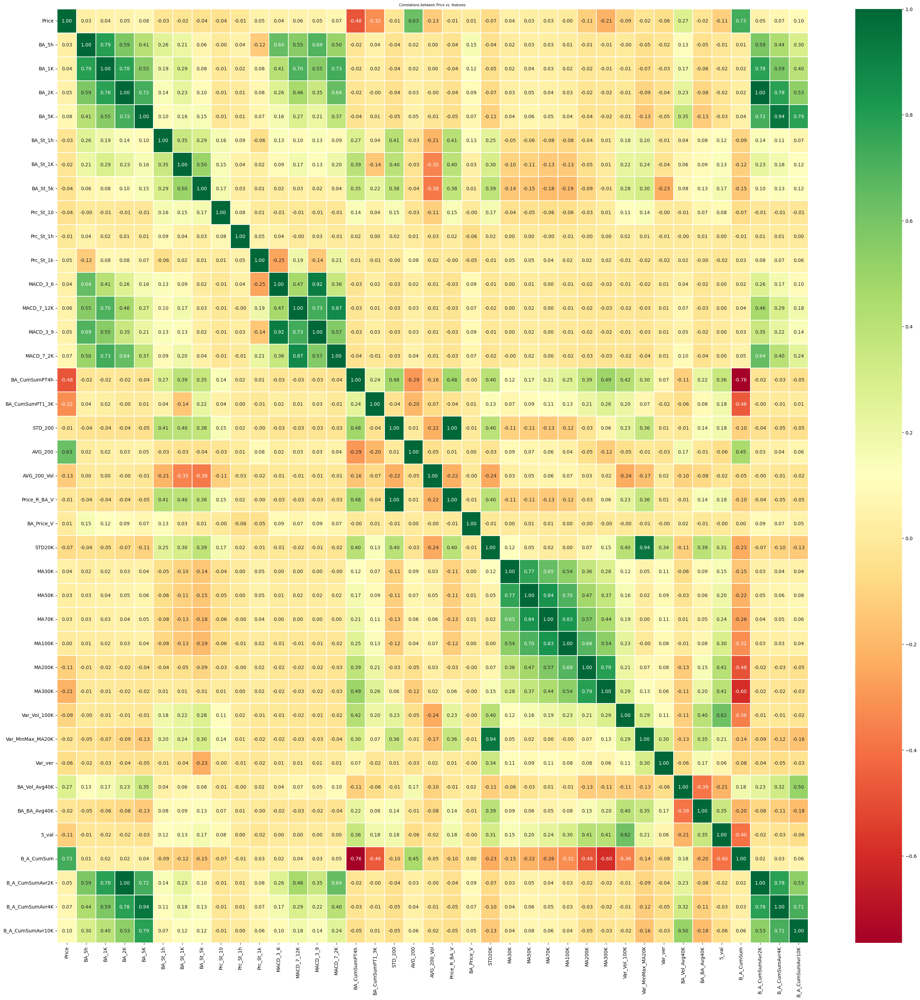

In [208]:
#Seaborn heatmap of correlations in es data

plt.subplots(figsize=(35,35))

#matrix = np.tril(es.corr())
#sns.heatmap(es.corr(), linewidths=.1, annot=True, cmap='coolwarm', center=0, mask=matrix);
sns.heatmap(es1[ar].corr(), linewidths=.2, annot=True, cmap='RdYlGn',  fmt='.2f');
plt.title('Correlations between Price vs. features ', fontsize=7)

In [216]:
es1.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1h', 'BA_St_1K', 'BA_St_5k', 'Prc_St_10', 'Prc_St_1h',
       'Prc_St_1k', 'MACD_3_6', 'MACD_7_12K', 'MACD_3_9', 'MACD_7_2K',
       'Shifted2K', 'Shifted30K', 'Vol_avg2h_PT', 'Vol_CumS_PT',
       'BA_CumSumPT4h', 'BA_CumSumPT1_3K', 'STD_200', 'AVG_200', 'AVG_200_Vol',
       'Price_R_BA_V', 'BA_Price_V', 'STD20K', 'MA30K', 'MA50K', 'MA70K',
       'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K', 'Var_MinMax_MA20K',
       'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val', 'Price_Target',
       'Price_Target5', 'B_A_CumSum', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr4K',
       'B_A_CumSumAvr10K'],
      dtype='object')

In [228]:
# function to create scatterplots of Price against desired columns
def scatterplots(columns, ncol=None, figsize=(50, 50)):
    if ncol is None:
        ncol = len(columns)
    nrow = int(np.ceil(len(columns) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, squeeze=False)
    fig.subplots_adjust(wspace=0.5, hspace=0.6)
    for i, col in enumerate(columns):
        ax = axes.flatten()[i]
        ax.scatter(x = col, y = 'Price', data=es1, alpha=0.5)
        ax.set(xlabel=col, ylabel='Price')
    nsubplots = nrow * ncol    
    for empty in range(i+1, nsubplots):
        axes.flatten()[empty].set_visible(False)

In [224]:

features = [x for x in es1.columns if x not in ['Time', 'Hour', 'Minute', 'Second', 'Msec']]

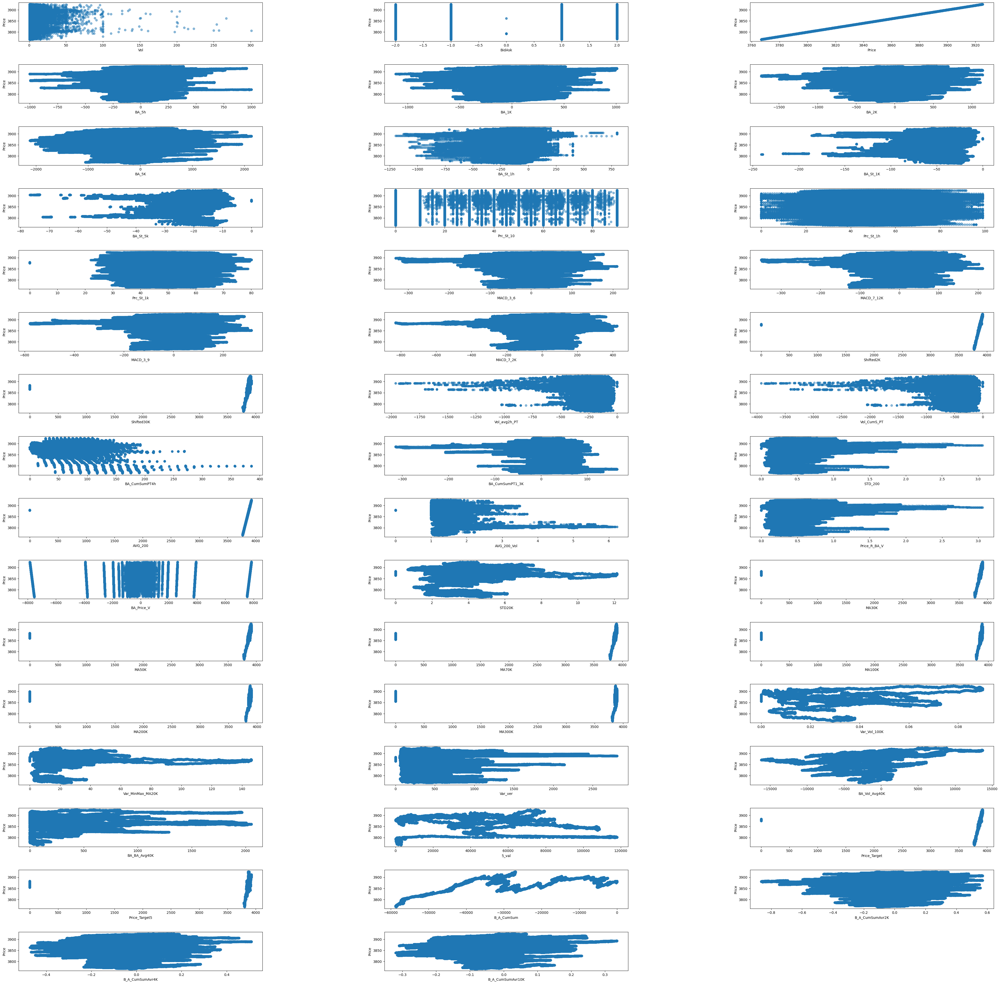

In [226]:
scatterplots(features, ncol=3, figsize=(50, 50)) # scatterplots(features, ncol=5, figsize=(17, 17))

In [229]:
es1['MA70K_ratio'] = es1.Price / es1.MA70K
es1['MA100K_ratio'] = es1.Price / es1.MA100K
es1['Var_MinMax_MA20K_ratio'] = es1.Price / es1.Var_MinMax_MA20K
es1['B_A_CumSumAvr10K_ratio'] = es1.Price / es1.B_A_CumSumAvr10K

es1['MA300K_ratio'] = es1.Price / es1.MA300K
es1['Var_Vol_100K_ratio'] = es1.Price / es1[ 'Var_Vol_100K']
es1['7_ratio'] = es1.Price / es1.MA200K
es1['8_ratio'] = es1.Price / es1.BA_Vol_Avg40K  
   
es1['BA_5h_ratio'] =  es1.Price / es1['BA_5h']
es1['BA_1K_ratio'] =  es1.Price / es1['BA_1K']
es1['BA_2K_ratio'] = es1.Price / es1['BA_2K']
es1['BA_5K_ratio'] = es1.Price / es1['BA_5K']

es1['BA_St_1h_ratio'] = es1.Price / es1['BA_St_1h']
es1['BA_St_1K_ratio'] = es1.Price / es1['BA_St_1K']
es1['BA_St_5k_ratio'] = es1.Price / es1['BA_St_5k']
es1['Prc_St_10_ratio'] = es1.Price / es1['Prc_St_10']
es1['Prc_St_1h_ratio'] = es1.Price / es1['Prc_St_1h']

es1['Prc_St_1k_ratio'] = es1.Price / es1['Prc_St_1k']
es1['MACD_3_6_ratio'] = es1.Price / es1['MACD_3_6']
es1['MACD_7_12K_ratio'] = es1.Price / es1['MACD_7_12K']
es1['MACD_3_9_ratio'] = es1.Price / es1['MACD_3_9']
es1['MACD_7_2K_ratio'] = es1.Price / es1['MACD_7_2K']

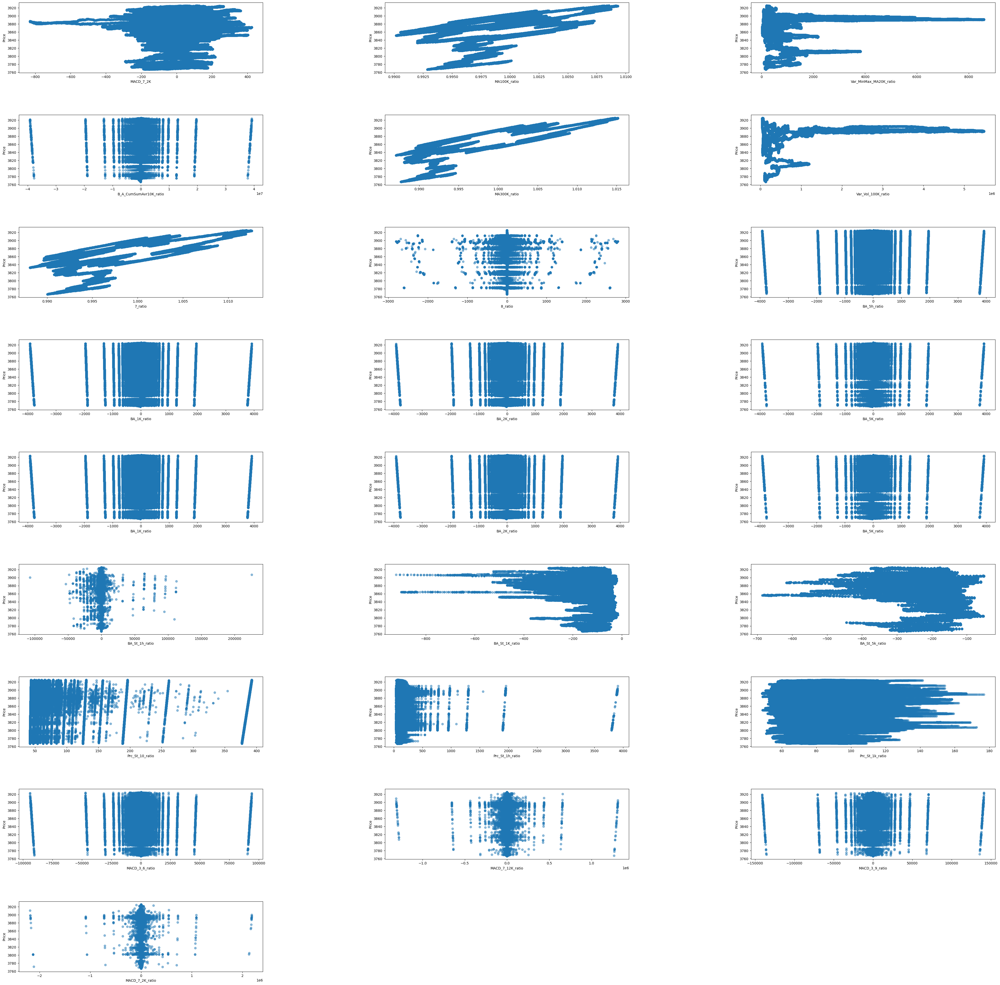

In [230]:
scatterplots(['MACD_7_2K', 'MA100K_ratio', 'Var_MinMax_MA20K_ratio','B_A_CumSumAvr10K_ratio', 'MA300K_ratio','Var_Vol_100K_ratio', '7_ratio','8_ratio', 'BA_5h_ratio', 'BA_1K_ratio','BA_2K_ratio',
              'BA_5K_ratio', 'BA_1K_ratio', 'BA_2K_ratio', 'BA_5K_ratio', 'BA_St_1h_ratio','BA_St_1K_ratio', 'BA_St_5k_ratio', 'Prc_St_10_ratio', 'Prc_St_1h_ratio',
              'Prc_St_1k_ratio', 'MACD_3_6_ratio', 'MACD_7_12K_ratio', 'MACD_3_9_ratio', 'MACD_7_2K_ratio'], ncol=3)

In [ ]:
import time
starttime = time.time()
while True:
    print('tick' + starttime)
    time.sleep(5.0 - ((time.time() - starttime ) % 5.0))

In [1]:
# Define a function called plot_timeseries
def plot_timeseries(axes, x, y, color, xlabel, ylabel):

  # Plot the inputs x,y in the provided color
  axes.plot(x, y, color=color)

  # Set the x-axis label
  axes.set_xlabel(xlabel)

  # Set the y-axis label
  axes.set_ylabel(ylabel, color=color)

  # Set the colors tick params for y-axis
  axes.tick_params('y', colors=color)

In [ ]:
fig, ax = plt.subplots()

# Plot the CO2 levels time-series in blue
plot_timeseries(ax, climate_change.index, climate_change["co2"], 'blue', "Time (years)", "CO2 levels")

# Create a twin Axes object that shares the x-axis
ax2 = ax.twinx()

# Plot the relative temperature data in red
plot_timeseries(ax2, climate_change.index, climate_change['relative_temp'], 'red', "Time (years)", "Relative temperature (Celsius)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Plot the CO2 levels time-series in blue
plot_timeseries(ax, climate_change.index, climate_change["co2"], 'blue', "Time (years)", "CO2 levels")

# Create an Axes object that shares the x-axis
ax2 = ax.twinx()

# Plot the relative temperature data in red
plot_timeseries(ax2, climate_change.index, climate_change['relative_temp'], 'red', "Time (years)", "Relative temp (Celsius)")

# Annotate the point with relative temperature >1 degree
ax2.annotate(">1 degree", xy=(pd.Timestamp('2015-10-06'), 1), xytext=(pd.Timestamp('2008-10-06'), -0.2), arrowprops={'arrowstyle':'->', 'color':'gray'})

plt.show()

In [ ]:
# Add bars for "Gold" with the label "Gold"
ax.bar(medals.index, medals["Gold"], label="Gold")

# Stack bars for "Silver" on top with label "Silver"
ax.bar(medals.index, medals["Silver"], bottom=medals["Gold"], label="Silver")

# Stack bars for "Bronze" on top of that with label "Bronze"
ax.bar(medals.index, medals["Bronze"], bottom=medals["Gold"] + medals["Silver"], label="Bronze")

# Display the legend
ax.legend()

plt.show()

In [ ]:
fig, ax = plt.subplots()
# Plot a histogram of "Weight" for mens_rowing
ax.hist(mens_rowing["Weight"])

# Compare to histogram of "Weight" for mens_gymnastics
ax.hist(mens_gymnastics["Weight"])

# Set the x-axis label to "Weight (kg)"
ax.set_xlabel("Weight (kg)")

# Set the y-axis label to "# of observations"
ax.set_ylabel("# of observations")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Plot a histogram of "Weight" for mens_rowing
ax.hist(mens_rowing["Weight"], histtype='step', label="Rowing", bins=5)

# Compare to histogram of "Weight" for mens_gymnastics
ax.hist(mens_gymnastics["Weight"], histtype='step', label="Gymnastics", bins=5)

ax.set_xlabel("Weight (kg)")
ax.set_ylabel("# of observations")

# Add the legend and show the Figure
ax.legend()
plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add a bar for the rowing "Height" column mean/std
ax.bar("Rowing", mens_rowing["Height"].mean(), yerr=mens_rowing["Height"].std())

# Add a bar for the gymnastics "Height" column mean/std
ax.bar("Gymnastics", mens_gymnastics["Height"].mean(), yerr=mens_gymnastics["Height"].std())

# Label the y-axis
ax.set_ylabel("Height (cm)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add the Seattle temperature data in each month with standard deviation error bars
ax.errorbar(seattle_weather["MONTH"], seattle_weather["MLY-TAVG-NORMAL"], yerr=seattle_weather["MLY-TAVG-STDDEV"])

# Add the Austin temperature data in each month with standard deviation error bars
ax.errorbar(austin_weather["MONTH"], austin_weather["MLY-TAVG-NORMAL"], yerr=austin_weather["MLY-TAVG-STDDEV"])

# Set the y-axis label
ax.set_ylabel("Temperature (Fahrenheit)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add a boxplot for the "Height" column in the DataFrames
ax.boxplot([mens_rowing["Height"], mens_gymnastics["Height"]])

# Add x-axis tick labels:
ax.set_xticklabels(["Rowing", "Gymnastics"])

# Add a y-axis label
ax.set_ylabel("Height (cm)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add data: "co2" on x-axis, "relative_temp" on y-axis
ax.scatter(climate_change["co2"], climate_change["relative_temp"])

# Set the x-axis label to "CO2 (ppm)"
ax.set_xlabel("CO2 (ppm)")

# Set the y-axis label to "Relative temperature (C)"
ax.set_ylabel("Relative temperature (C)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add data: "co2", "relative_temp" as x-y, index as color
ax.scatter(climate_change["co2"], climate_change["relative_temp"], c=climate_change.index)

# Set the x-axis label to "CO2 (ppm)"
ax.set_xlabel("CO2 (ppm)")

# Set the y-axis label to "Relative temperature (C)"
ax.set_ylabel("Relative temperature (C)")

plt.show()

In [ ]:
# Use the "ggplot" style and create new Figure/Axes
plt.style.use('ggplot')
fig, ax = plt.subplots()
ax.plot(seattle_weather["MONTH"], seattle_weather["MLY-TAVG-NORMAL"])
plt.show()

In [ ]:
# Use the "Solarize_Light2" style and create new Figure/Axes
plt.style.use('Solarize_Light2')
fig, ax = plt.subplots()
ax.plot(austin_weather["MONTH"], austin_weather["MLY-TAVG-NORMAL"])
plt.show()

In [ ]:
fig.savefig('my_figure.png')
# Save as a PNG file with 300 dpi
fig.savefig('my_figure_300dpi.png', dpi=300)

In [ ]:
# Set figure dimensions and save as a PNG
fig.set_size_inches([3, 5])
fig.savefig('figure_3_5.png')
# Set figure dimensions and save as a PNG
fig.set_size_inches([5, 3])
fig.savefig('figure_5_3.png')

In [ ]:
fig, ax = plt.subplots()

# Loop over the different sports branches
for sport in sports:
  # Extract the rows only for this sport
  sport_df = summer_2016_medals[summer_2016_medals["Sport"] == sport]
  # Add a bar for the "Weight" mean with std y error bar
  ax.bar(sport, sport_df["Weight"].mean(), yerr=sport_df["Weight"].std())

ax.set_ylabel("Weight")
ax.set_xticklabels(sports, rotation=90)

# Save the figure to file
fig.savefig("sports_weights.png")